# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2025-12-21 21:19:27 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2025-12-21 21:19:27 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

In [3]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# 设置任务Task前缀
task_type = 'Intra'
# 设置数据目录
# mydir = r'你自己数据的路径'
mydir = get_param_in_cwd('radio_dir') or okds.ct
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
group_info = get_param_in_cwd('dataset_column') or 'group'
labelf = get_param_in_cwd('label_file') or os.path.join(mydir, 'label.csv')
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(mydir, images='images', masks='masks')
diagnose_3d_image_mask_settings(images, masks)
print(f'获取到{len(images)}个样本。')

检查通过！
获取到812个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2025-12-21 21:19:49 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [6]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")
from onekey_algo.custom.components.Radiology import ConventionalRadiomics

# 瘤内Mask ID
intra_mask_id = get_param_in_cwd('intra_mask_id') or 1

rad_data = []
# 如果要自定义一些特征提取方式，可以使用param_file。
# param_file = r'./custom_settings/exampleCT.yaml'
# extractor_settings这个参数放的是参数配置文件的位置，默认为空。
param_file = get_param_in_cwd('extractor_settings')
radiomics = ConventionalRadiomics(param_file, correctMask=True)

for prefix, mask_id in zip(['intra'], [intra_mask_id]):
    if os.path.exists(f'features/{task_type}_rad_features_{mask_id}.csv'):
        rad_data.append(pd.read_csv(f'features/{task_type}_rad_features_{mask_id}.csv', header=0))
    else:
        radiomics.extract(images, masks, labels=mask_id, with_fd=get_param_in_cwd('with_fd'))
        feat_ = radiomics.get_label_data_frame(label=mask_id)
        feat_.columns = [f"{prefix}_{c.replace('-', '_')}" if c != 'ID' else c for c in feat_.columns]
        feat_.to_csv(f'features/{task_type}_rad_features_{mask_id}.csv', header=True, index=False)
        rad_data.append(feat_)
rad_data = rad_data[0]
rad_data

[2025-12-21 21:19:49 - <frozen onekey_algo.custom.components.Radiology>: 608]	INFO	使用C:\\OnekeyPlatform\\onekey_comp\\comp9-Solutions\\sol1. 传统组学-单中心-临床\\custom_settings\\exampleUS.yaml的配置文件。
[2025-12-21 21:19:50 - core.py: 188]	INFO	validation.valid


,ID,intra_exponential_firstorder_10Percentile,intra_exponential_firstorder_90Percentile,intra_exponential_firstorder_Energy,intra_exponential_firstorder_Entropy,intra_exponential_firstorder_InterquartileRange,intra_exponential_firstorder_Kurtosis,intra_exponential_firstorder_Maximum,intra_exponential_firstorder_Mean,intra_exponential_firstorder_MeanAbsoluteDeviation,...,intra_wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,intra_wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_glszm_ZonePercentage,intra_wavelet_LLL_glszm_ZoneVariance,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength
0,1.nii.gz,0.695,5.584,4.572e+08,0.859,1.774,376.158,4511.804,20.016,34.264,...,2.779e+05,2.440e-03,8.203,0.995,0.005,1.048e-03,0.009,1.006e+07,130.579,4383.465
1,10.nii.gz,0.546,5.403,1.075e+08,0.623,2.136,11.124,15.880,2.271,1.776,...,9.468e+04,9.577e-03,6.615,0.991,0.009,2.952e-03,0.020,8.484e+05,217.387,2152.026
2,100.nii.gz,1.097,8.983,3.455e+08,1.156,2.982,96.133,151.913,5.045,4.348,...,1.899e+05,3.022e-03,7.983,0.982,0.018,1.304e-03,0.011,5.569e+06,102.005,2731.910
3,1001.nii.gz,1.797,8.476,7.383e+08,1.348,3.158,157.753,1826.080,16.572,23.810,...,1.473e+06,1.431e-03,9.048,0.994,0.006,3.745e-04,0.007,5.293e+07,206.652,10131.955
4,1003.nii.gz,0.651,21.322,5.152e+09,1.708,4.019,599.271,2470.583,12.042,17.109,...,8.937e+05,2.630e-04,10.254,0.819,58.643,4.546e-04,0.003,8.932e+07,18.659,9553.485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
807,98.nii.gz,0.639,3.436,1.267e+08,0.067,1.250,122.144,138.261,2.799,2.445,...,9.853e+04,8.380e-03,6.720,0.992,0.008,3.352e-03,0.014,1.381e+06,208.861,1332.785
808,980.nii.gz,1.091,62.156,3.221e+09,2.913,13.973,213.667,3758.810,38.221,53.803,...,1.211e+06,3.520e-04,10.307,0.992,0.008,2.521e-04,0.004,1.071e+08,24.514,6991.750
809,981.nii.gz,0.658,6.820,1.304e+09,0.856,2.308,41.711,65.326,3.077,2.617,...,4.860e+05,8.211e-04,9.471,0.973,0.171,3.741e-04,0.008,2.749e+07,33.038,6774.811
810,984.nii.gz,5.219,32.046,2.435e+08,2.858,12.681,30.873,212.754,17.682,12.588,...,3.723e+05,4.348e-03,7.684,0.983,0.017,9.094e-04,0.013,5.937e+06,315.150,6593.797


## 特征统计

,0,count
1,firstorder,306
0,glcm,374
4,gldm,238
2,glrlm,272
3,glszm,272
5,ngtdm,85
6,shape,14


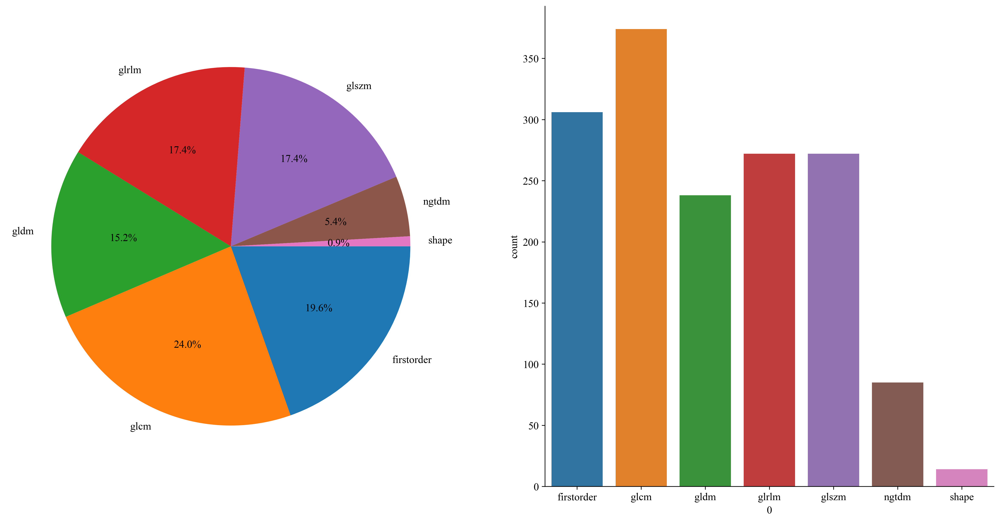

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
sorted_counts = pd.DataFrame([c.split('_')[-2] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
display(sorted_counts)

plt.figure(figsize=(20, 10))
ax = plt.subplot(121)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
# plt.bar_label(bar.containers[0])
ax = plt.subplot(122)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
bar = sns.barplot(data=sorted_counts, x=0, y='count', )
plt.savefig(f'img/{task_type}_feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data = label_data[['ID', group_info] + labels]
label_data

,ID,group,label
0,1.nii.gz,train,0
1,100.nii.gz,val,1
2,1001.nii.gz,train,0
3,1003.nii.gz,train,1
4,101.nii.gz,val,0
...,...,...,...
755,978.nii.gz,train,0
756,980.nii.gz,train,1
757,981.nii.gz,train,1
758,984.nii.gz,train,1


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
from onekey_algo.custom.utils import print_join_info

print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data

[2025-12-21 21:19:51 - <frozen onekey_algo.custom.utils>:  63]	WARNING	存在ID特征不完全匹配的问题！在左边不在右边的ID：['10.nii.gz', '102.nii.gz', '1021.nii.gz', '1022.nii.gz', '1041.nii.gz', '1075.nii.gz', '1090.nii.gz', '1108.nii.gz', '1115.nii.gz', '1209.nii.gz', '122.nii.gz', '1228.nii.gz', '1258.nii.gz', '130.nii.gz', '1304.nii.gz', '1335.nii.gz', '1338.nii.gz', '1355.nii.gz', '1365.nii.gz', '1388.nii.gz', '1399.nii.gz', '1406.nii.gz', '1407.nii.gz', '146.nii.gz', '170.nii.gz', '171.nii.gz', '178.nii.gz', '191.nii.gz', '204.nii.gz', '258.nii.gz', '300.nii.gz', '31.nii.gz', '350.nii.gz', '41.nii.gz', '42.nii.gz', '519.nii.gz', '527.nii.gz', '560.nii.gz', '587.nii.gz', '609.nii.gz', '682.nii.gz', '727.nii.gz', '768.nii.gz', '783.nii.gz', '796.nii.gz', '834.nii.gz', '874.nii.gz', '876.nii.gz', '882.nii.gz', '883.nii.gz', '96.nii.gz', '98.nii.gz']；在右边不在左边的ID：[]


label
1        386
0        374
dtype: int64


,intra_exponential_firstorder_10Percentile,intra_exponential_firstorder_90Percentile,intra_exponential_firstorder_Energy,intra_exponential_firstorder_Entropy,intra_exponential_firstorder_InterquartileRange,intra_exponential_firstorder_Kurtosis,intra_exponential_firstorder_Maximum,intra_exponential_firstorder_Mean,intra_exponential_firstorder_MeanAbsoluteDeviation,intra_exponential_firstorder_Median,...,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_glszm_ZonePercentage,intra_wavelet_LLL_glszm_ZoneVariance,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength,group,label
0,0.695,5.584,4.572e+08,0.859,1.774,376.158,4511.804,20.016,34.264,1.445,...,8.203,0.995,0.005,1.048e-03,0.009,1.006e+07,130.579,4383.465,train,0
1,1.097,8.983,3.455e+08,1.156,2.982,96.133,151.913,5.045,4.348,2.359,...,7.983,0.982,0.018,1.304e-03,0.011,5.569e+06,102.005,2731.910,val,1
2,1.797,8.476,7.383e+08,1.348,3.158,157.753,1826.080,16.572,23.810,3.687,...,9.048,0.994,0.006,3.745e-04,0.007,5.293e+07,206.652,10131.955,train,0
3,0.651,21.322,5.152e+09,1.708,4.019,599.271,2470.583,12.042,17.109,1.065,...,10.254,0.819,58.643,4.546e-04,0.003,8.932e+07,18.659,9553.485,train,1
4,1.697,30.677,4.647e+08,2.609,9.558,25.738,211.338,13.686,13.007,5.915,...,8.403,0.998,0.002,6.955e-04,0.010,1.016e+07,97.175,4115.857,val,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
755,3.529,29.073,1.821e+08,2.817,13.913,11.037,83.450,14.147,9.112,10.129,...,7.274,1.000,0.000,1.601e-03,0.012,3.648e+06,328.949,3092.994,train,0
756,1.091,62.156,3.221e+09,2.913,13.973,213.667,3758.810,38.221,53.803,4.683,...,10.307,0.992,0.008,2.521e-04,0.004,1.071e+08,24.514,6991.750,train,1
757,0.658,6.820,1.304e+09,0.856,2.308,41.711,65.326,3.077,2.617,1.453,...,9.471,0.973,0.171,3.741e-04,0.008,2.749e+07,33.038,6774.811,train,1
758,5.219,32.046,2.435e+08,2.858,12.681,30.873,212.754,17.682,12.588,10.488,...,7.684,0.983,0.017,9.094e-04,0.013,5.937e+06,315.150,6593.797,train,1


## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,intra_exponential_firstorder_10Percentile,intra_exponential_firstorder_90Percentile,intra_exponential_firstorder_Energy,intra_exponential_firstorder_Entropy,intra_exponential_firstorder_InterquartileRange,intra_exponential_firstorder_Kurtosis,intra_exponential_firstorder_Maximum,intra_exponential_firstorder_Mean,intra_exponential_firstorder_MeanAbsoluteDeviation,intra_exponential_firstorder_Median,...,intra_wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_glszm_ZonePercentage,intra_wavelet_LLL_glszm_ZoneVariance,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength,label
count,760.000,760.000,7.600e+02,7.600e+02,760.000,760.000,760.000,760.000,760.000,760.000,...,7.600e+02,760.000,760.000,760.000,7.600e+02,7.600e+02,7.600e+02,760.000,760.000,760.000
mean,1.380,27.520,1.555e+09,1.572e+00,8.635,243.991,1247.685,16.759,20.256,4.840,...,2.543e-03,8.673,0.972,15.703,1.103e-03,9.666e-03,1.873e+07,177.272,4268.967,0.508
std,3.109,60.192,2.404e+09,1.221e+00,20.320,397.222,1688.060,28.637,34.605,11.850,...,3.486e-03,1.055,0.055,162.375,1.642e-03,4.038e-03,2.389e+07,1275.332,2981.724,0.500
min,0.006,0.265,2.340e+07,-3.203e-16,0.000,1.953,1.556,0.168,0.075,0.065,...,4.326e-05,4.524,0.298,0.000,9.781e-05,9.564e-04,2.565e+05,2.440,486.244,0.000
25%,0.420,4.461,3.978e+08,5.742e-01,1.490,44.010,75.777,2.974,2.526,1.062,...,6.740e-04,8.035,0.978,0.011,4.043e-04,6.927e-03,4.220e+06,13.359,2109.809,0.000
50%,0.722,10.249,7.432e+08,1.318e+00,3.359,110.509,359.004,7.134,7.087,2.180,...,1.526e-03,8.770,0.984,0.017,6.197e-04,9.424e-03,1.069e+07,32.459,3509.197,1.000
75%,1.401,26.488,1.733e+09,2.358e+00,8.535,270.808,2019.280,18.615,22.816,4.746,...,2.872e-03,9.427,0.990,0.025,1.156e-03,1.209e-02,2.300e+07,96.970,5586.936,1.000
max,52.824,847.767,2.943e+10,5.967e+00,376.940,4607.864,8595.781,382.373,299.826,244.077,...,4.351e-02,11.049,1.000,2950.735,2.241e-02,2.612e-02,1.709e+08,33662.323,23169.345,1.000


## Z-score

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info)
data = data.dropna(axis=1)
data.describe()

,intra_exponential_firstorder_10Percentile,intra_exponential_firstorder_90Percentile,intra_exponential_firstorder_Energy,intra_exponential_firstorder_Entropy,intra_exponential_firstorder_InterquartileRange,intra_exponential_firstorder_Kurtosis,intra_exponential_firstorder_Maximum,intra_exponential_firstorder_Mean,intra_exponential_firstorder_MeanAbsoluteDeviation,intra_exponential_firstorder_Median,...,intra_wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_glszm_ZonePercentage,intra_wavelet_LLL_glszm_ZoneVariance,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength,label
count,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,760.000,...,7.600e+02,7.600e+02,7.600e+02,760.000,7.600e+02,7.600e+02,7.600e+02,7.600e+02,7.600e+02,760.000
mean,1.402e-17,-9.349e-18,8.414e-17,5.610e-17,9.349e-18,5.843e-17,-1.122e-16,2.805e-17,-5.610e-17,0.000,...,-4.090e-17,-5.002e-16,3.039e-16,0.000,-5.025e-17,-1.215e-16,-2.805e-17,-3.272e-17,8.414e-17,0.508
std,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,0.999,...,9.987e-01,9.987e-01,9.987e-01,0.999,9.987e-01,9.987e-01,9.987e-01,9.987e-01,9.987e-01,0.500
min,-7.367e-01,-7.915e-01,-8.225e-01,-1.575e+00,-7.551e-01,-7.854e-01,-9.306e-01,-8.175e-01,-7.761e-01,-0.657,...,-8.222e-01,-4.489e+00,-1.109e+01,-0.133,-7.590e-01,-2.189e+00,-8.664e-01,-4.032e-01,-1.387e+00,0.000
25%,-3.129e-01,-3.598e-01,-4.950e-01,-8.256e-01,-3.262e-01,-4.973e-01,-6.596e-01,-4.620e-01,-4.980e-01,-0.303,...,-5.085e-01,-5.802e-01,8.547e-02,-0.125,-4.318e-01,-7.020e-01,-6.163e-01,-3.366e-01,-7.195e-01,0.000
50%,-2.049e-01,-2.784e-01,-3.323e-01,-2.293e-01,-2.483e-01,-3.268e-01,-5.078e-01,-3.361e-01,-3.720e-01,-0.217,...,-3.081e-01,1.045e-01,2.295e-01,-0.119,-2.757e-01,-6.108e-02,-3.378e-01,-1.874e-01,-2.631e-01,1.000
75%,1.378e-02,-2.587e-02,7.196e-02,6.101e-01,-7.779e-03,5.667e-02,4.162e-01,5.808e-02,8.693e-02,-0.006,...,9.778e-02,7.200e-01,3.347e-01,-0.119,4.587e-02,5.996e-01,1.782e-01,-8.699e-02,4.401e-01,1.000
max,1.390e+01,1.163e+01,8.659e+00,3.752e+00,1.534e+01,1.012e+01,4.435e+00,1.150e+01,7.605e+00,17.090,...,9.871e+00,2.351e+00,6.536e-01,13.835,1.050e+01,4.230e+00,6.891e+00,1.328e+01,6.075e+00,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

stats = clinic_stats(data[data['group'] == 'train'], stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,intra_exponential_firstorder_10Percentile,-0.00±1.00,-0.03±0.93,0.03±1.07,0.44
1,intra_exponential_firstorder_90Percentile,0.00±1.00,-0.02±1.12,0.02±0.86,0.108
2,intra_exponential_firstorder_Energy,0.00±1.00,-0.27±0.45,0.27±1.28,<0.001
3,intra_exponential_firstorder_Entropy,0.00±1.00,-0.09±0.96,0.09±1.03,0.057
4,intra_exponential_firstorder_InterquartileRange,0.00±1.00,-0.01±1.22,0.01±0.73,0.129
...,...,...,...,...,...
1549,intra_wavelet_LLL_ngtdm_Busyness,-0.00±1.00,0.14±1.08,-0.14±0.89,<0.001
1550,intra_wavelet_LLL_ngtdm_Coarseness,-0.00±1.00,0.27±0.90,-0.27±1.02,<0.001
1551,intra_wavelet_LLL_ngtdm_Complexity,-0.00±1.00,-0.26±0.63,0.26±1.21,<0.001
1552,intra_wavelet_LLL_ngtdm_Contrast,-0.00±1.00,0.14±1.24,-0.14±0.66,<0.001


#### 输出特征分布的图

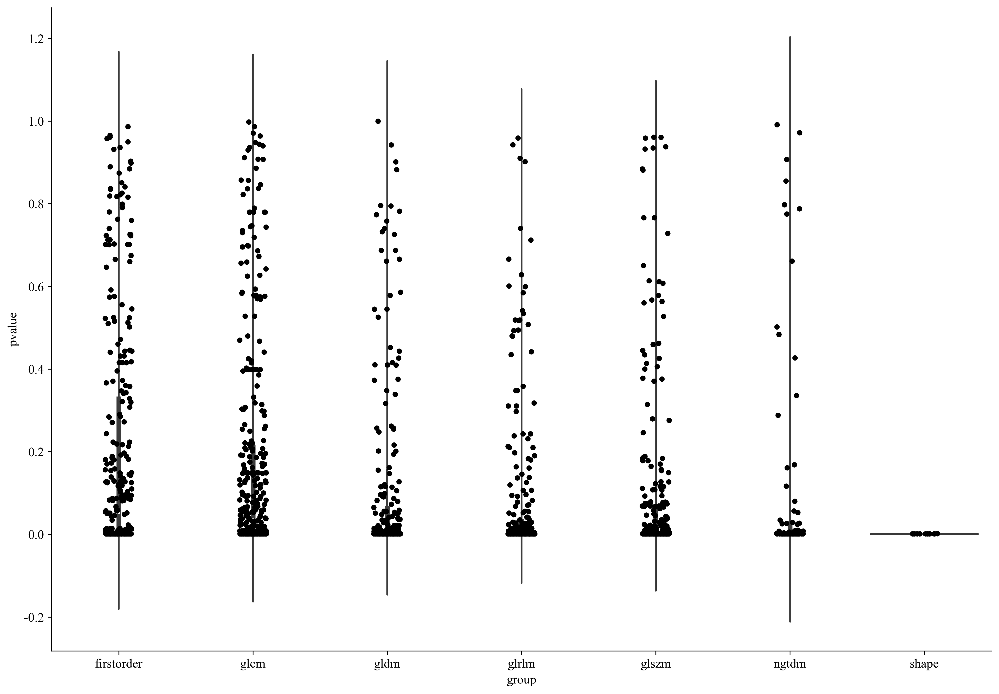

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-2])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}_feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = 0.05
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
data = data[sel_feature]
data

,intra_exponential_firstorder_Energy,intra_exponential_firstorder_Kurtosis,intra_exponential_firstorder_Maximum,intra_exponential_firstorder_Range,intra_exponential_firstorder_Skewness,intra_exponential_firstorder_TotalEnergy,intra_exponential_glcm_Autocorrelation,intra_exponential_glcm_ClusterProminence,intra_exponential_glcm_ClusterShade,intra_exponential_glcm_ClusterTendency,...,intra_wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,intra_wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength,label,group
80,0.630,-0.516,-0.823,-0.822,-0.604,0.630,-0.465,-0.296,-0.373,-0.473,...,-0.011,-0.451,1.000,-0.319,-0.599,-0.114,-0.298,0.060,1,test
81,1.429,2.472,-0.021,-0.020,2.194,1.429,-0.428,-0.293,-0.359,-0.430,...,-0.069,-0.485,1.153,-0.216,-1.276,0.340,-0.296,-0.420,1,test
82,-0.261,-0.268,-0.388,-0.388,0.011,-0.261,-0.385,-0.294,-0.358,-0.401,...,-0.746,-0.219,0.167,-0.180,0.449,-0.400,-0.249,0.374,1,test
83,-0.522,-0.583,-0.676,-0.676,-0.652,-0.522,-0.432,-0.296,-0.372,-0.452,...,-1.132,0.129,-0.713,-0.037,2.136,-0.742,-0.237,-0.557,1,test
84,-0.232,2.089,0.153,0.153,2.200,-0.232,-0.430,-0.286,-0.336,-0.383,...,-1.019,0.395,-0.152,0.107,-0.004,-0.599,-0.256,-0.133,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,-0.382,-0.415,-0.548,-0.548,-0.413,-0.382,-0.201,-0.148,-0.182,-0.247,...,0.274,-0.304,0.148,-0.298,-0.298,-0.232,-0.115,-0.159,1,val
721,0.501,0.217,-0.053,-0.053,0.668,0.501,-0.160,-0.147,-0.175,-0.204,...,0.493,-0.548,1.039,-0.410,-1.067,0.674,-0.130,-0.039,1,val
728,-0.488,-0.179,-0.463,-0.464,0.011,-0.488,-0.201,-0.148,-0.182,-0.246,...,-0.246,-0.053,-0.062,-0.297,0.393,-0.226,-0.086,1.166,0,val
730,1.340,3.241,2.777,2.778,3.127,1.340,-0.031,0.180,0.185,0.124,...,2.312,-0.595,1.139,-0.450,-1.556,0.733,-0.133,-0.658,1,val


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2025-12-21 21:20:22 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = data[data['group'] == 'train'][[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix

if data.shape[0] < 100:
    plt.figure(figsize=(50.0, 40.0))

    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}_feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[0] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}_feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2025-12-21 21:20:23 - <frozen onekey_algo.custom.Manager>: 159]	INFO	播放视频功能已经设置成：Disable！


In [20]:
import math
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr

sel_feature = select_feature(pearson_corr, threshold=0.9, topn=256, verbose=False)
if get_param_in_cwd('mrmr_sel_feature_num') is not None:
    sel_feature = select_feature_mrmr(data[data['group'] == 'train'][sel_feature + labels], 
                                      num_features=get_param_in_cwd('mrmr_sel_feature_num'))
sel_feature += labels + [group_info]
sel_feature

['intra_exponential_firstorder_Range',
 'intra_exponential_firstorder_Skewness',
 'intra_exponential_glcm_Correlation',
 'intra_exponential_glcm_Idn',
 'intra_exponential_glcm_Imc1',
 'intra_exponential_gldm_LargeDependenceHighGrayLevelEmphasis',
 'intra_exponential_glrlm_RunEntropy',
 'intra_exponential_glrlm_ShortRunEmphasis',
 'intra_exponential_glrlm_ShortRunHighGrayLevelEmphasis',
 'intra_exponential_glszm_LargeAreaHighGrayLevelEmphasis',
 'intra_exponential_glszm_LowGrayLevelZoneEmphasis',
 'intra_exponential_glszm_SizeZoneNonUniformity',
 'intra_exponential_glszm_SmallAreaHighGrayLevelEmphasis',
 'intra_exponential_glszm_SmallAreaLowGrayLevelEmphasis',
 'intra_exponential_glszm_ZoneEntropy',
 'intra_exponential_ngtdm_Busyness',
 'intra_exponential_ngtdm_Coarseness',
 'intra_exponential_ngtdm_Complexity',
 'intra_exponential_ngtdm_Strength',
 'intra_gradient_firstorder_Minimum',
 'intra_gradient_firstorder_Range',
 'intra_gradient_glcm_ClusterShade',
 'intra_gradient_glcm_Cluster

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data

,intra_exponential_firstorder_Range,intra_exponential_firstorder_Skewness,intra_exponential_glcm_Correlation,intra_exponential_glcm_Idn,intra_exponential_glcm_Imc1,intra_exponential_gldm_LargeDependenceHighGrayLevelEmphasis,intra_exponential_glrlm_RunEntropy,intra_exponential_glrlm_ShortRunEmphasis,intra_exponential_glrlm_ShortRunHighGrayLevelEmphasis,intra_exponential_glszm_LargeAreaHighGrayLevelEmphasis,...,intra_wavelet_LLL_glszm_SizeZoneNonUniformity,intra_wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,intra_wavelet_LLL_glszm_ZoneEntropy,intra_wavelet_LLL_ngtdm_Busyness,intra_wavelet_LLL_ngtdm_Coarseness,intra_wavelet_LLL_ngtdm_Complexity,intra_wavelet_LLL_ngtdm_Contrast,intra_wavelet_LLL_ngtdm_Strength,label,group
80,-0.822,-0.604,1.935,0.345,-0.841,-0.367,0.295,-0.630,-0.483,0.512,...,0.716,-0.011,1.000,-0.319,-0.599,-0.114,-0.298,0.060,1,test
81,-0.020,2.194,0.002,0.852,-0.514,-0.351,0.176,-0.228,-0.400,1.237,...,1.615,-0.069,1.153,-0.216,-1.276,0.340,-0.296,-0.420,1,test
82,-0.388,0.011,0.712,0.701,-1.035,-0.324,0.446,-0.183,-0.240,-0.067,...,-0.242,-0.746,0.167,-0.180,0.449,-0.400,-0.249,0.374,1,test
83,-0.676,-0.652,0.561,-0.048,-0.301,-0.352,-0.186,0.194,-0.449,-0.478,...,-0.519,-1.132,-0.713,-0.037,2.136,-0.742,-0.237,-0.557,1,test
84,0.153,2.200,-1.258,0.875,-0.857,-0.322,0.554,-1.157,-0.112,0.363,...,-0.279,-1.019,-0.152,0.107,-0.004,-0.599,-0.256,-0.133,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
718,-0.548,-0.413,0.483,-0.292,0.158,-0.225,-0.089,0.386,-0.315,-0.452,...,-0.365,0.274,0.148,-0.298,-0.298,-0.232,-0.115,-0.159,1,val
721,-0.053,0.668,0.679,0.594,-0.260,-0.195,0.269,0.438,-0.266,-0.385,...,0.549,0.493,1.039,-0.410,-1.067,0.674,-0.130,-0.039,1,val
728,-0.464,0.011,0.273,0.404,-0.948,-0.219,-0.121,0.503,-0.307,-0.450,...,-0.474,-0.246,-0.062,-0.297,0.393,-0.226,-0.086,1.166,0,val
730,2.778,3.127,-0.716,0.819,0.934,0.723,-0.037,0.947,-0.079,-0.344,...,1.361,2.312,1.139,-0.450,-1.556,0.733,-0.133,-0.658,1,val


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

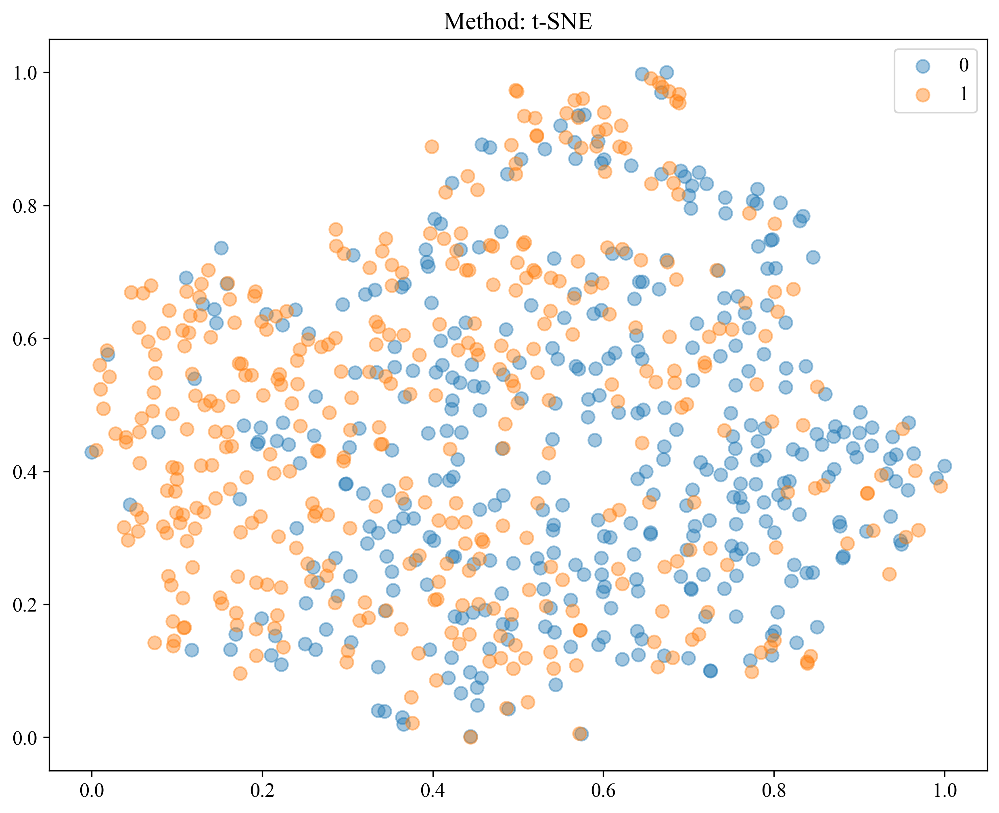

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(data[sel_feature[:-2]], data[labels[0]], methods='t-SNE', prefix=task_type)

## 构建数据

根据多中心的数据，进行数据划分。

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_test_data.shape}")

训练集样本数：(442, 268), 验证集样本数：(318, 268)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

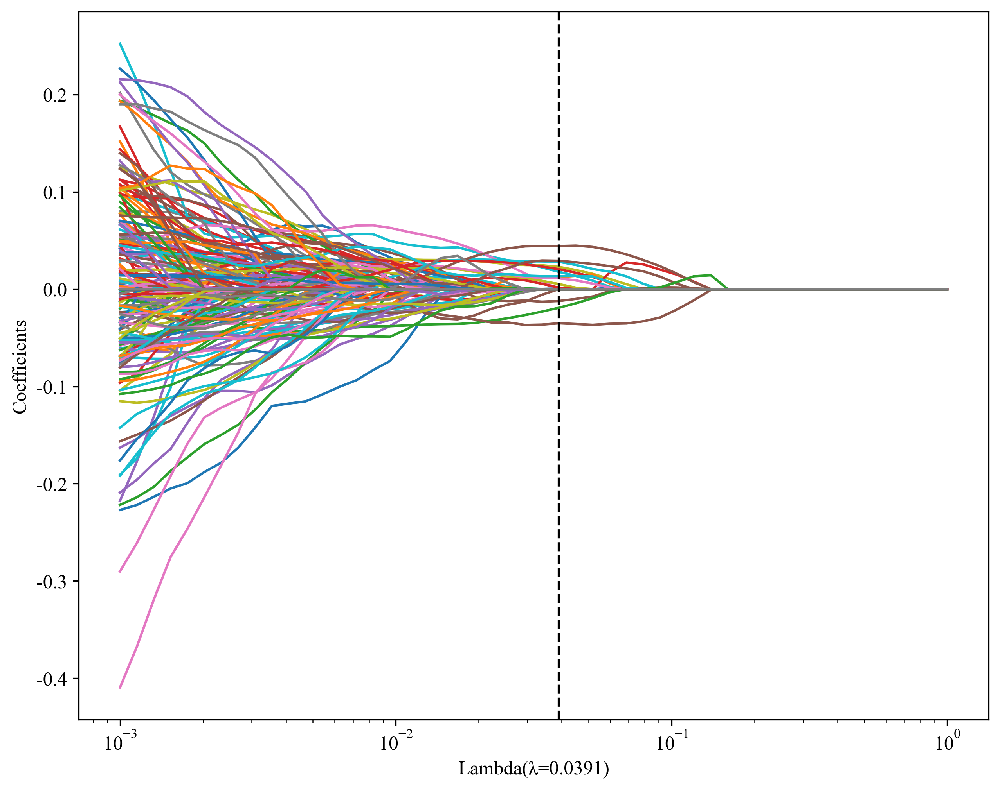

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None)
plt.savefig(f'img/{task_type}_feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

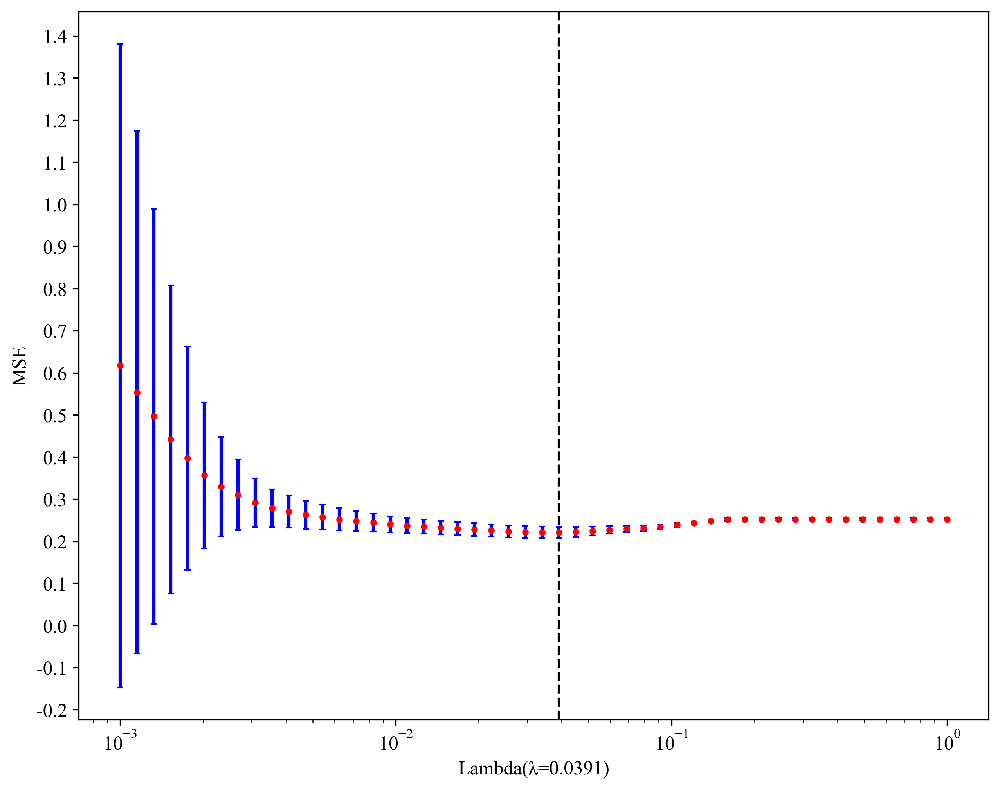

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50)
plt.savefig(f'img/{task_type}_feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [27]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.5  -0.012228 * intra_lbp_3D_k_firstorder_10Percentile +0.022847 * intra_lbp_3D_k_firstorder_Skewness +0.017716 * intra_lbp_3D_k_glcm_Correlation +0.000709 * intra_logarithm_glcm_ClusterProminence +0.012458 * intra_logarithm_glcm_Idn -0.019140 * intra_original_shape_Elongation +0.005188 * intra_wavelet_HHH_glszm_SizeZoneNonUniformity +0.001500 * intra_wavelet_HHL_firstorder_Range +0.011066 * intra_wavelet_HHL_glrlm_LongRunHighGrayLevelEmphasis +0.028068 * intra_wavelet_HHL_ngtdm_Complexity +0.044237 * intra_wavelet_HLH_glszm_SizeZoneNonUniformity -0.035108 * intra_wavelet_HLL_ngtdm_Coarseness +0.020462 * intra_wavelet_LHH_glszm_SmallAreaLowGrayLevelEmphasis +0.013408 * intra_wavelet_LHL_glcm_Idn +0.029152 * intra_wavelet_LLH_glszm_SmallAreaEmphasis


### 特征权重

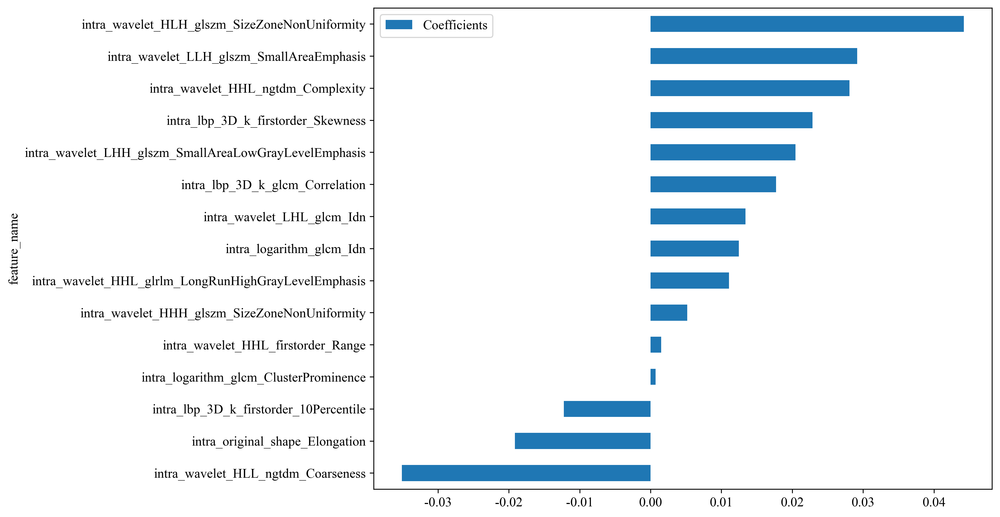

In [28]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/{task_type}_feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [29]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['intra_lbp_3D_k_firstorder_10Percentile',
       'intra_lbp_3D_k_firstorder_Skewness', 'intra_lbp_3D_k_glcm_Correlation',
       'intra_logarithm_glcm_ClusterProminence', 'intra_logarithm_glcm_Idn',
       'intra_original_shape_Elongation',
       'intra_wavelet_HHH_glszm_SizeZoneNonUniformity',
       'intra_wavelet_HHL_firstorder_Range',
       'intra_wavelet_HHL_glrlm_LongRunHighGrayLevelEmphasis',
       'intra_wavelet_HHL_ngtdm_Complexity',
       'intra_wavelet_HLH_glszm_SizeZoneNonUniformity',
       'intra_wavelet_HLL_ngtdm_Coarseness',
       'intra_wavelet_LHH_glszm_SmallAreaLowGrayLevelEmphasis',
       'intra_wavelet_LHL_glcm_Idn',
       'intra_wavelet_LLH_glszm_SmallAreaEmphasis'],
      dtype='object')

In [30]:
 X_data.to_csv('final_features0000.csv', index=False)

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [31]:
model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model_none_overfit(model_names)
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

[2025-12-21 21:20:33 - <frozen onekey_algo.custom.components.comp1>: 662]	WARNING	当cv=True的时候，采用的是交叉验证的模式，此时test_size的参数是不生效的，我们将忽略这个test_size设置。如果需要手动指定测试集比例，请修改cv=False。


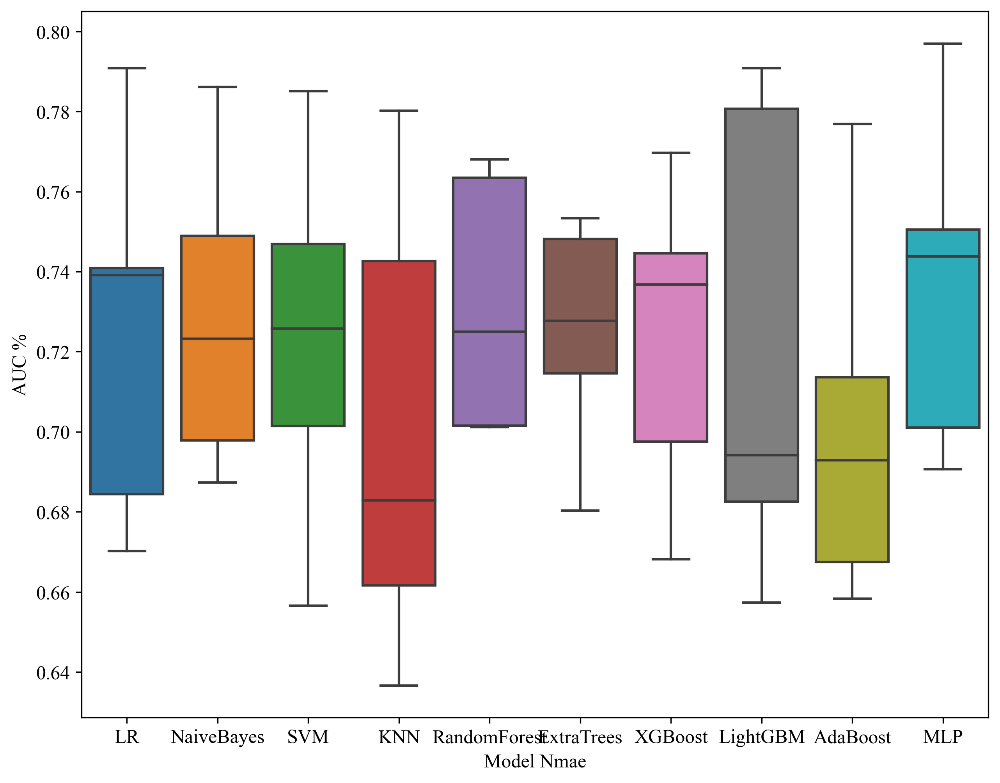

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Nmae')
plt.savefig(f'img/{task_type}_model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

In [33]:
# import joblib
# from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample
# targets = []
# os.makedirs('models', exist_ok=True)
# for l in labels:
#     new_models = list(okcomp.comp1.create_clf_model_none_overfit(model_names).values())
#     for mn, m in zip(model_names, new_models):
#         X_train_smote, y_train_smote = X_train_sel, y_train_sel
#         # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
#         if get_param_in_cwd('use_smote'):
#             X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
#         m.fit(X_train_smote, y_train_smote[l])
#         # 保存训练的模型
#         joblib.dump(m, f'models/{task_type}_{mn}_{l}.pkl') 
#         # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img')
        
# #         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
# #         plt.savefig(f"img/{task_type}_{mn}_learning_curve.svg", bbox_inches='tight')
#         plt.show()
#     targets.append(new_models)

In [34]:
import joblib
import json
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample

from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from onekey_algo.custom.encrypt.security import dump_onekey, load_onekey

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model_none_overfit(model_names)
    new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    new_models['SVM'] = SVC(probability=True, max_iter=100, kernel='linear')
    new_models['RandomForest'] = RandomForestClassifier(n_estimators=5, max_depth=3,
                                                        min_samples_split=4, random_state=0)
    new_models['XGBoost'] = XGBClassifier(n_estimators=8, objective='binary:logistic', max_depth=5, min_child_weight=.1,
                                              use_label_encoder=False, eval_metric='error')
    new_models['LightGBM'] = LGBMClassifier(n_estimators=2,  max_depth=1, min_child_weight=0.5,)
    new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=20, max_depth=3, min_samples_split=2, random_state=0)
    new_models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=50, random_state=0)
    new_models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=0)
    new_models['MLP'] = MLPClassifier(hidden_layer_sizes=(61, 128, 64, 32), max_iter=300, solver='sgd', random_state=0)
    model_names = list(new_models.keys())
    new_models = list(new_models.values())
    
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
        if get_param_in_cwd('use_smote', False):
            X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img')
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        plt.show()
    targets.append(new_models)
    encoder = json.loads(open('results/norm_info.json').read())
    dump_onekey({'TYPE':'WEBUI',
                 'data': pd.concat([ids, combined_data[selected_features[0]]], axis=1),
                 'models': {mn:nm for mn, nm in zip(model_names, new_models)},
                 'encoder': {fname: encoder[fname] for fname in selected_features[0]},
                 'feature_config': selected_features[0]},
                save_path=f'web/config')

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [35]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"train"))
                 
        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"test"))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.708,0.764,0.7206 - 0.8077,0.670,0.747,0.725,0.693,0.725,0.670,0.696,0.511,train
1,LR,0.679,0.746,0.6926 - 0.7986,0.624,0.739,0.720,0.646,0.720,0.624,0.669,0.510,test
2,NaiveBayes,0.683,0.745,0.6999 - 0.7902,0.742,0.624,0.664,0.708,0.664,0.742,0.701,0.058,train
3,NaiveBayes,0.673,0.727,0.6719 - 0.7814,0.818,0.516,0.646,0.725,0.646,0.818,0.722,0.032,test
4,SVM,0.647,0.688,0.6389 - 0.7371,0.557,0.738,0.680,0.625,0.680,0.557,0.612,0.588,train
5,SVM,0.667,0.707,0.6502 - 0.7629,0.879,0.438,0.628,0.770,0.628,0.879,0.732,0.529,test
6,KNN,0.758,0.836,0.8010 - 0.8712,0.738,0.778,0.769,0.748,0.769,0.738,0.753,0.600,train
7,KNN,0.679,0.733,0.6799 - 0.7866,0.642,0.719,0.711,0.651,0.711,0.642,0.675,0.600,test
8,RandomForest,0.762,0.824,0.7862 - 0.8628,0.814,0.710,0.738,0.793,0.738,0.814,0.774,0.446,train
9,RandomForest,0.698,0.747,0.6939 - 0.8004,0.648,0.752,0.738,0.665,0.738,0.648,0.690,0.517,test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

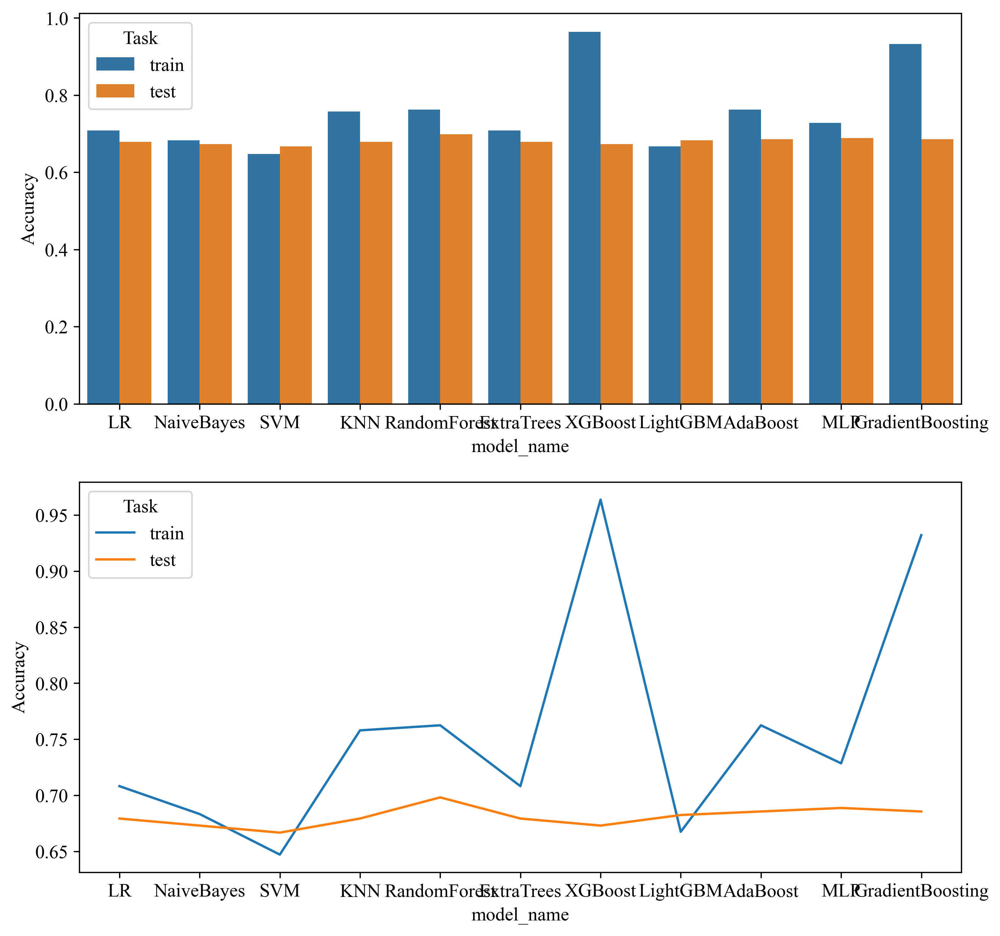

In [36]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}_model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

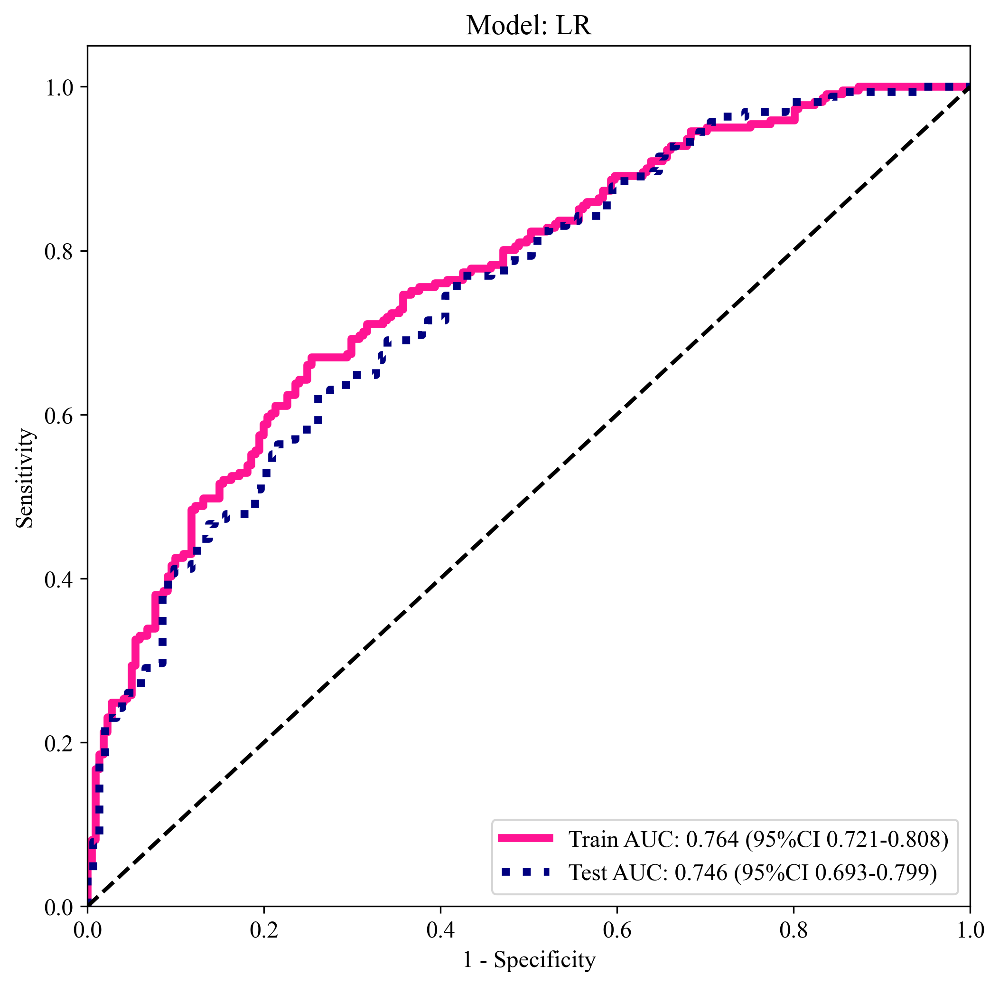

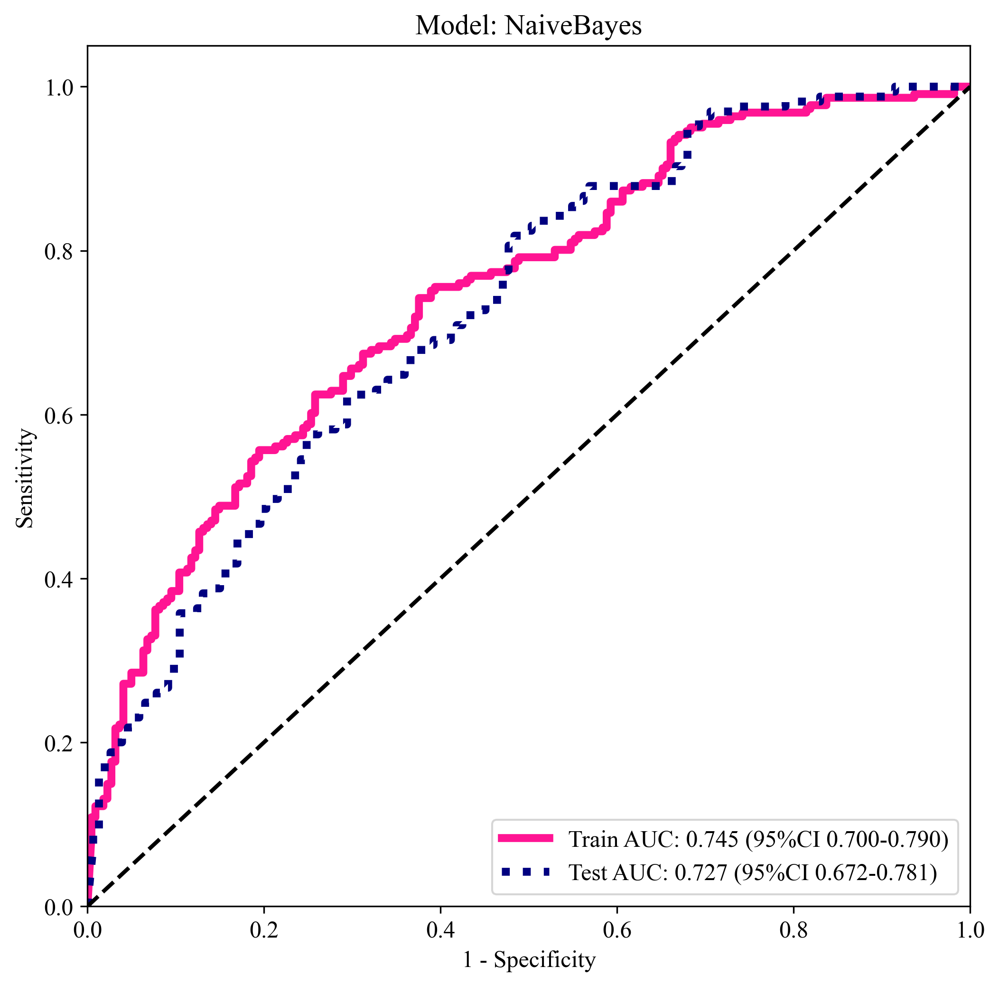

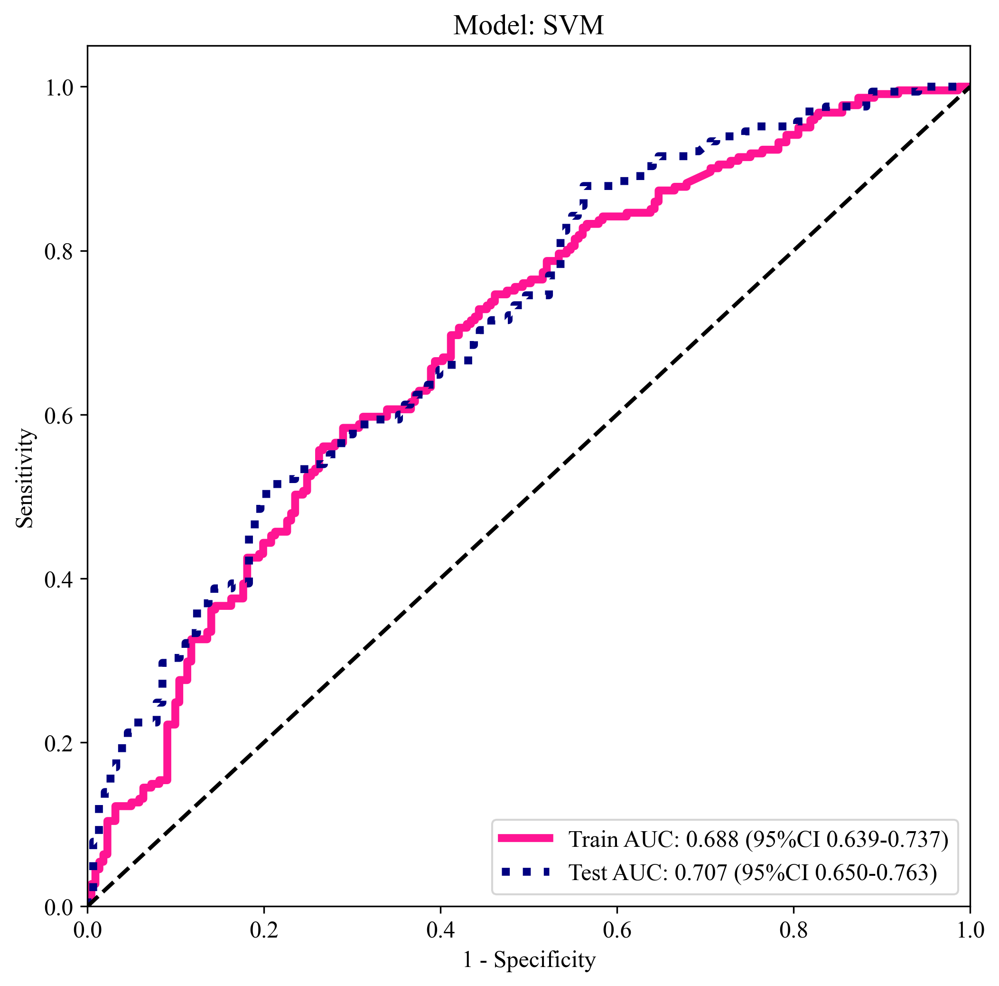

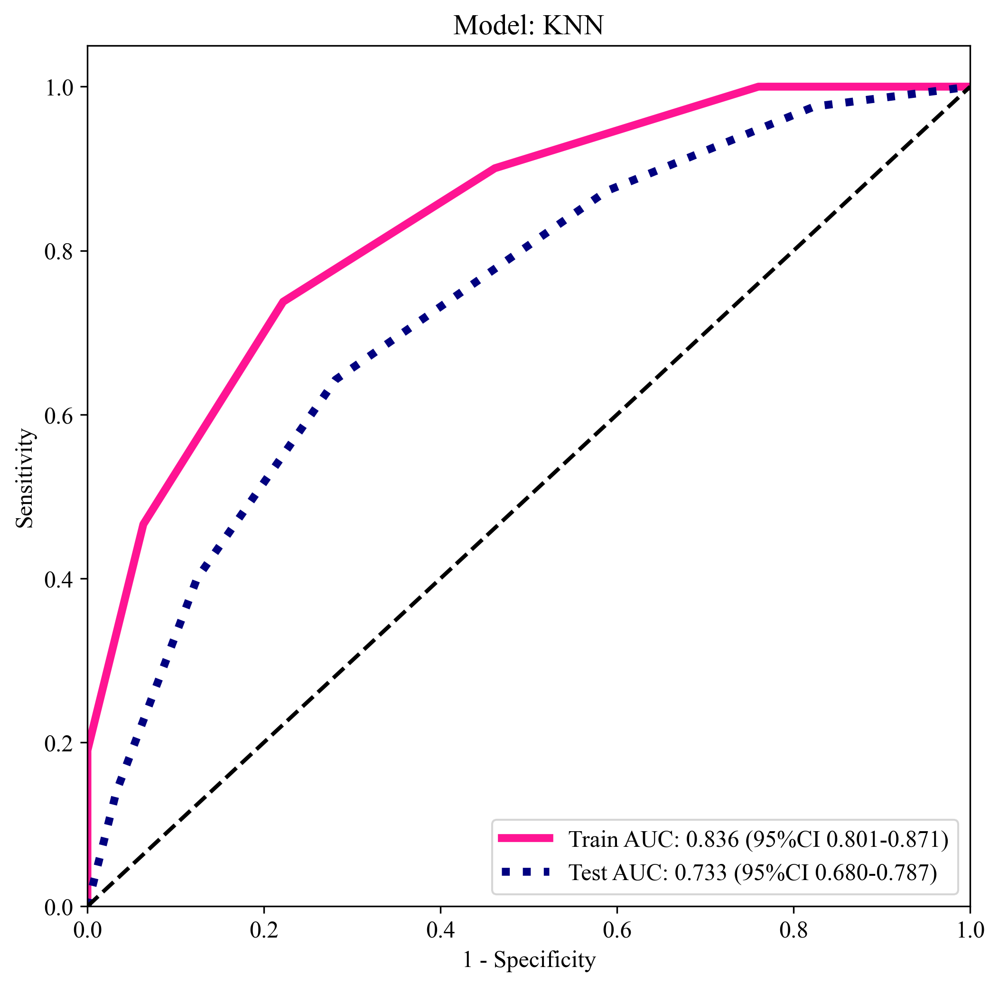

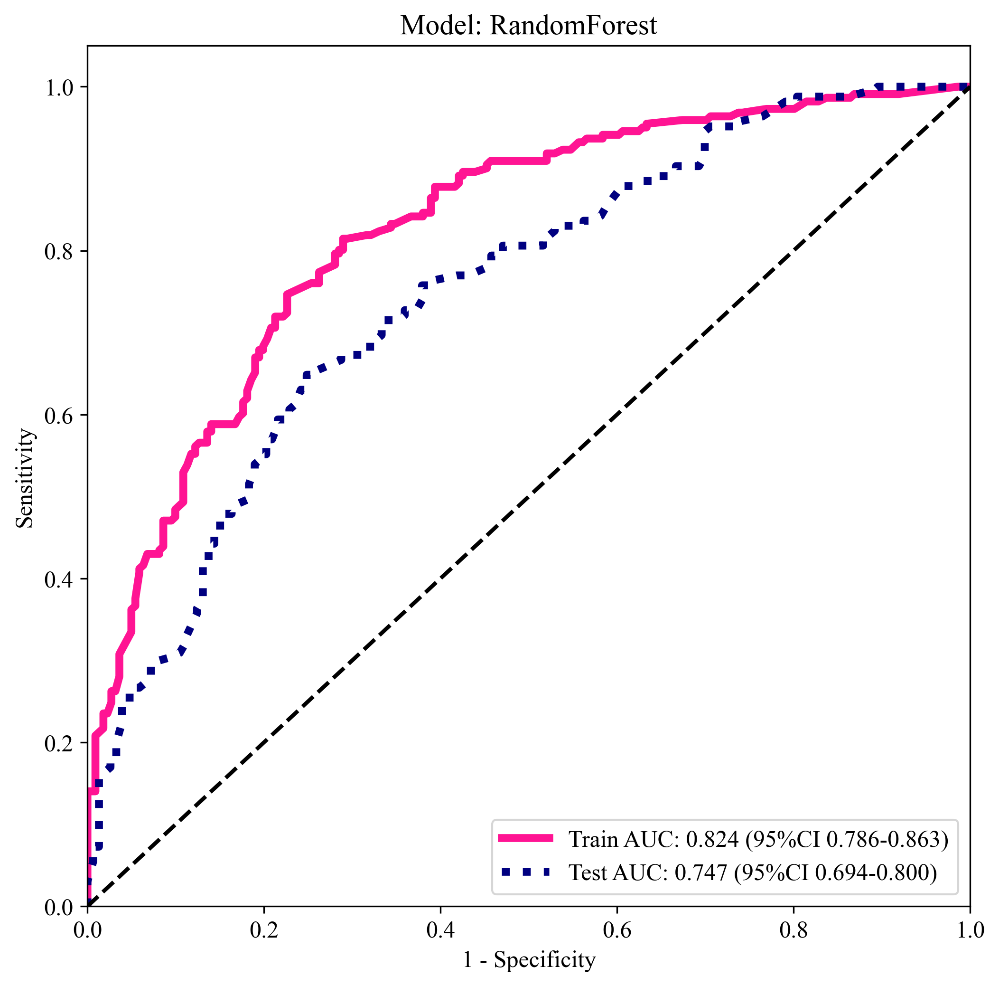

...

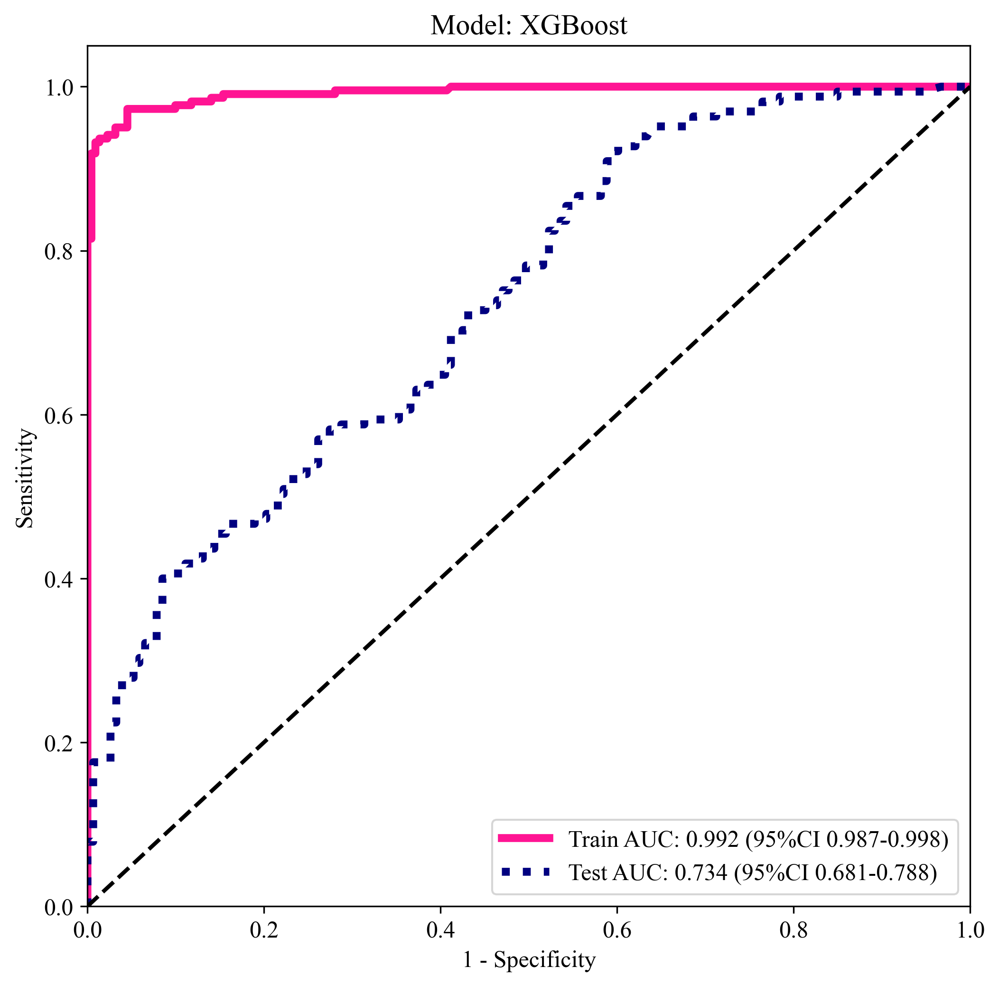

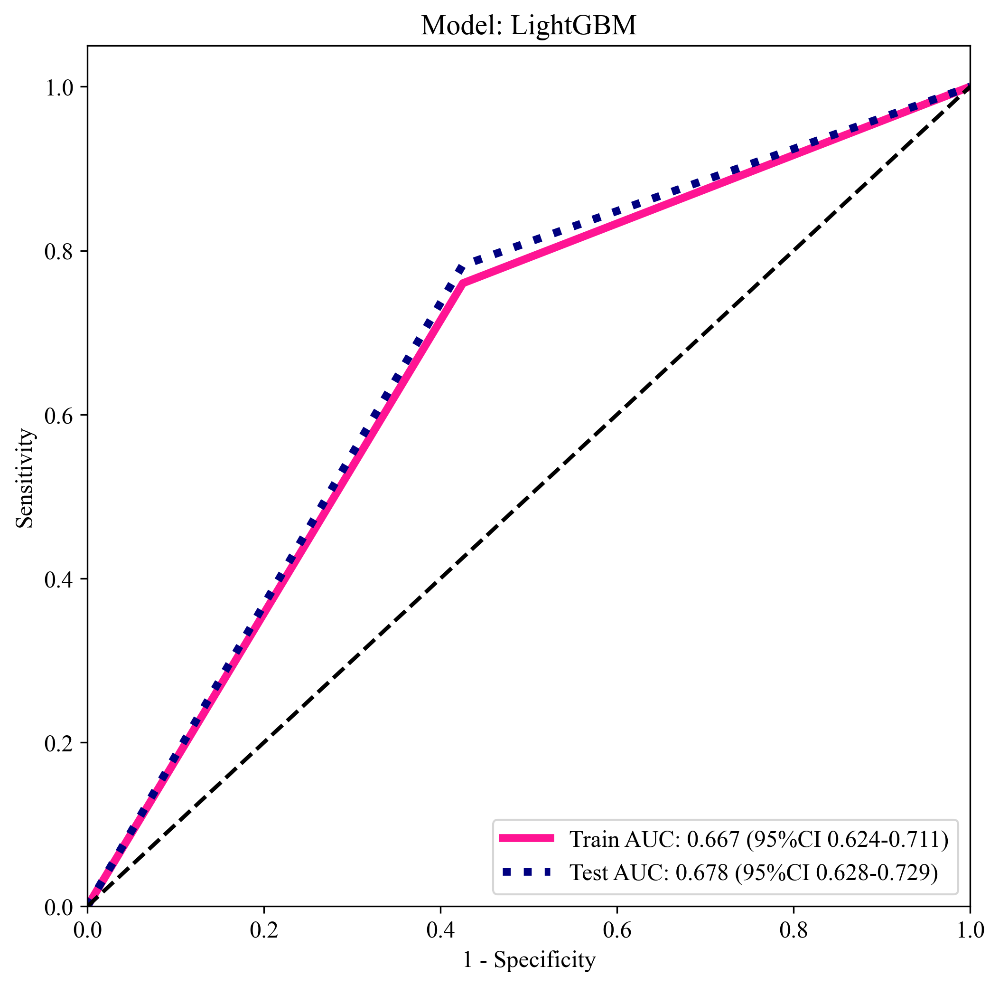

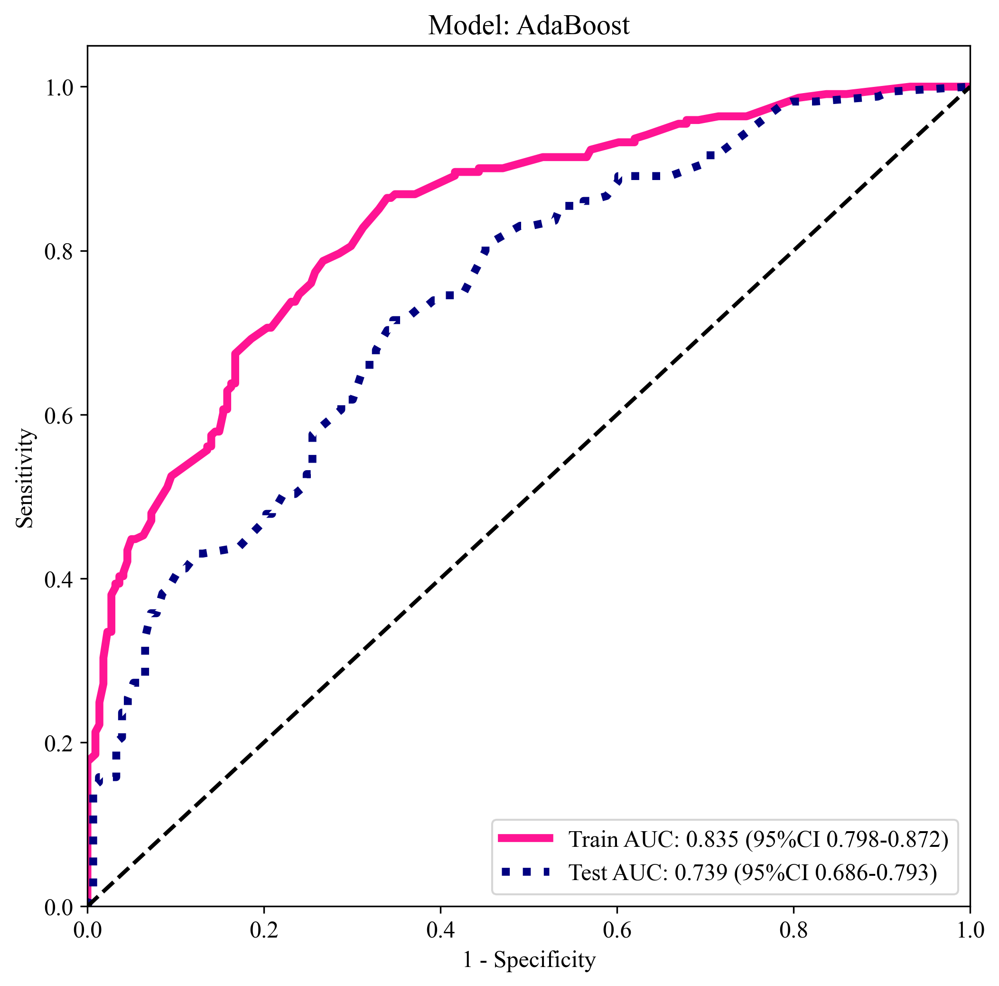

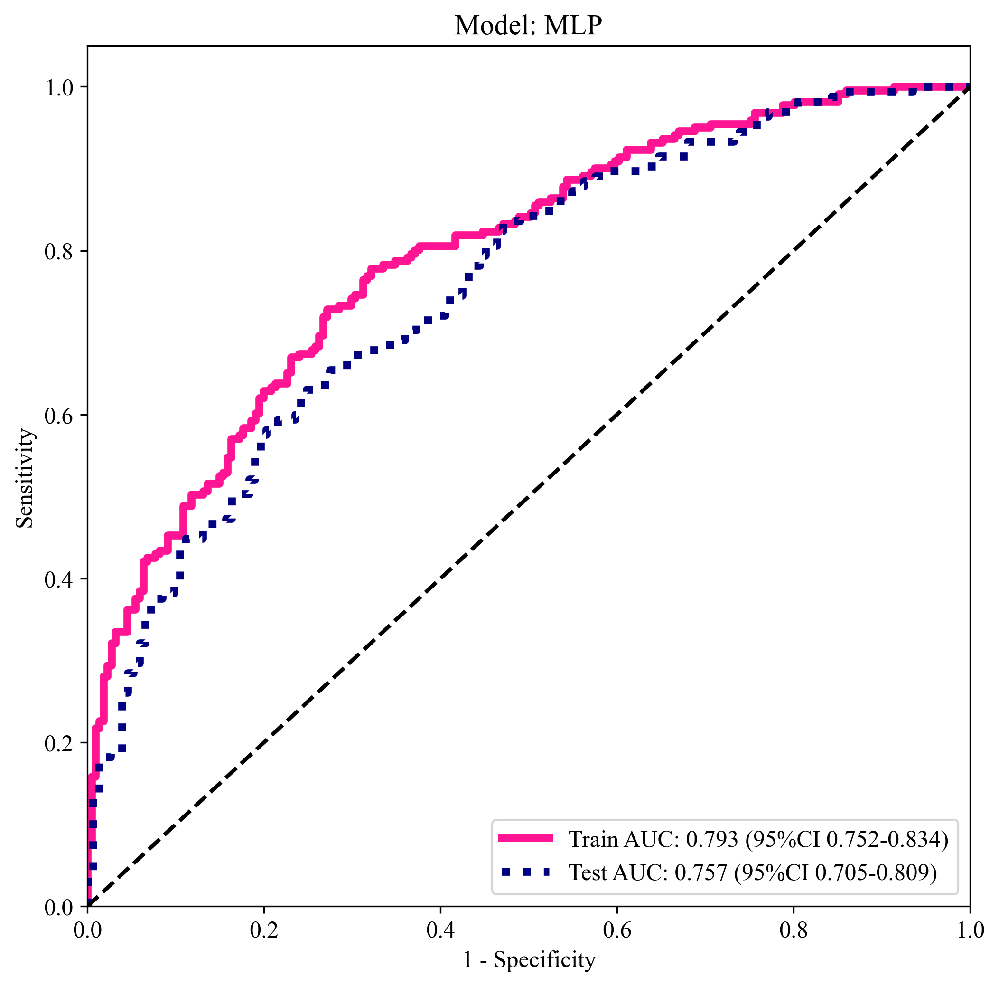

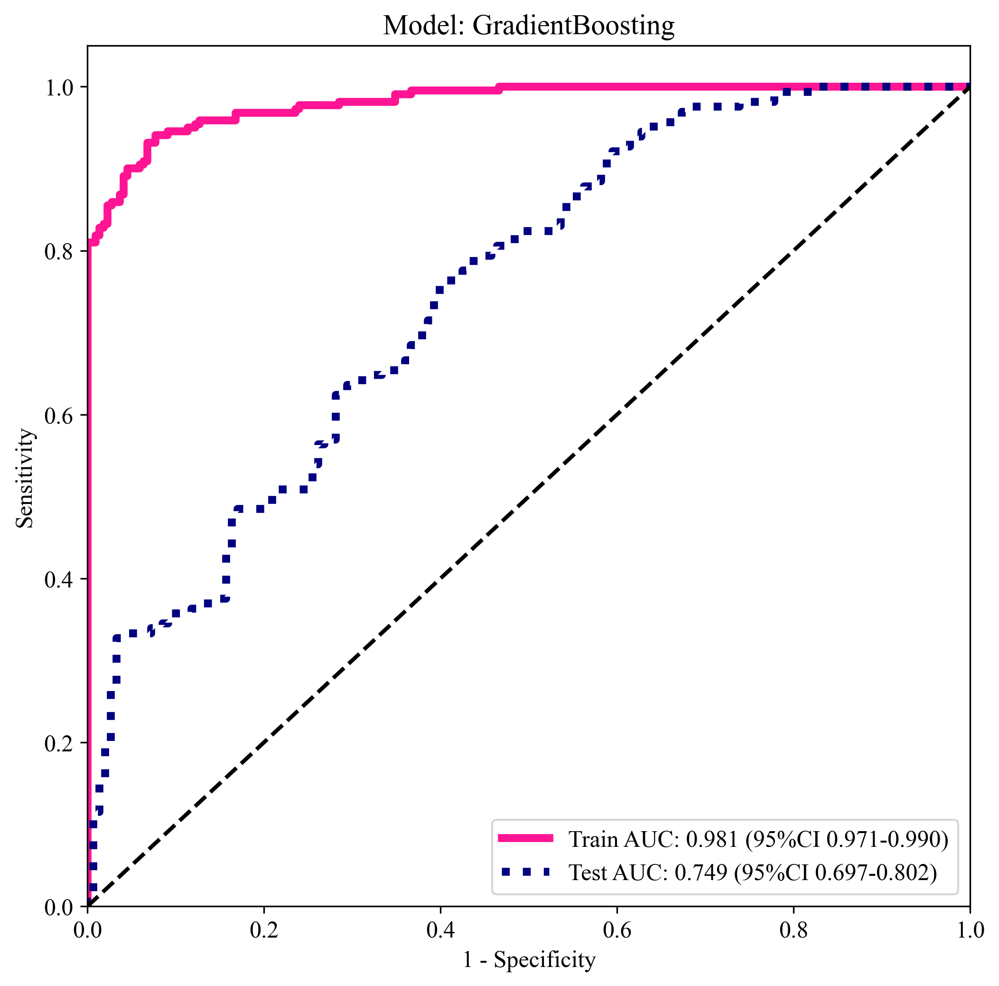

In [37]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{task_type}_model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

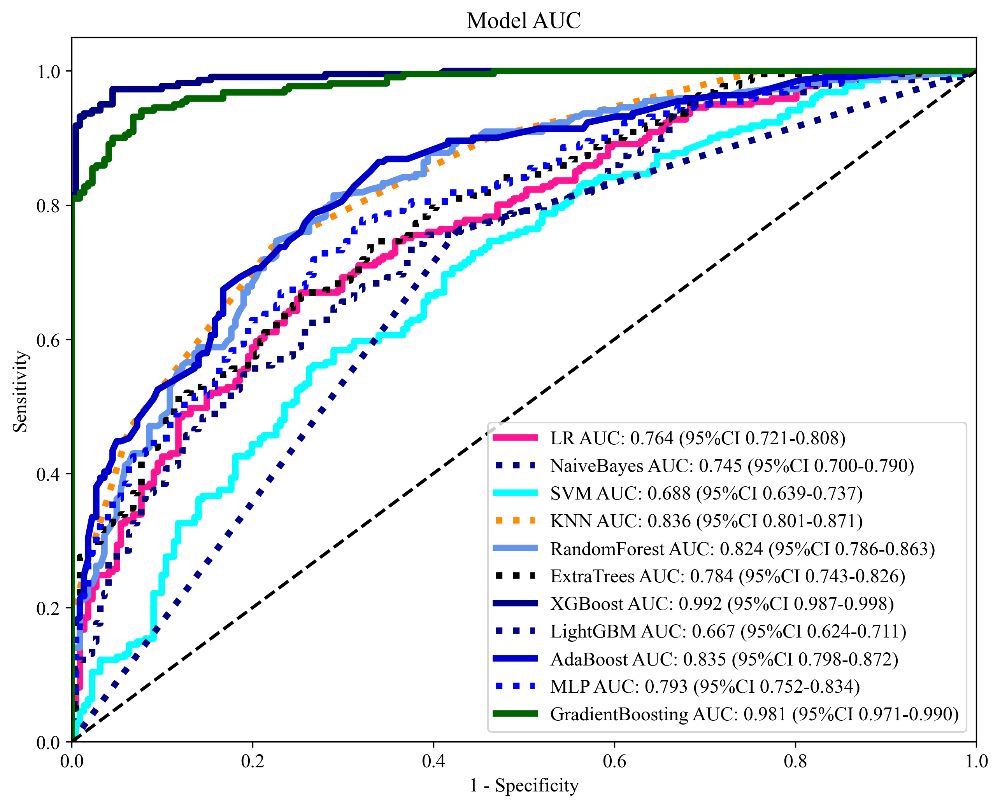

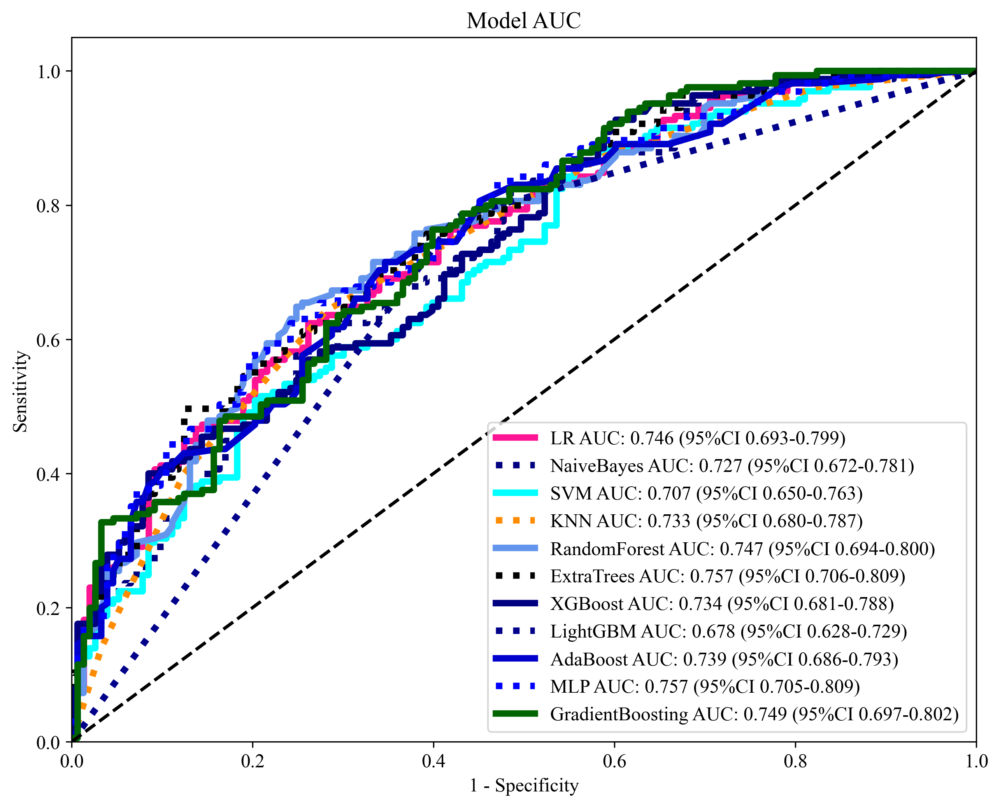

In [38]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][0])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}_model_roc_train.svg', bbox_inches = 'tight')
    plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}_model_roc_test.svg', bbox_inches = 'tight')

### DCA 决策曲线

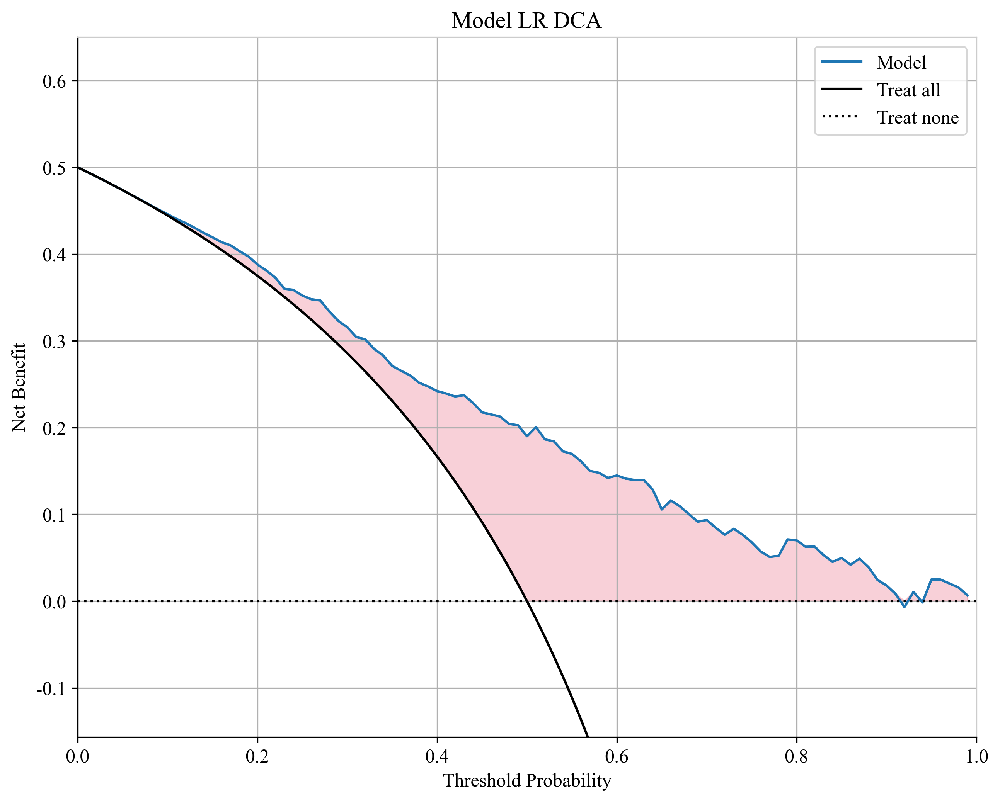

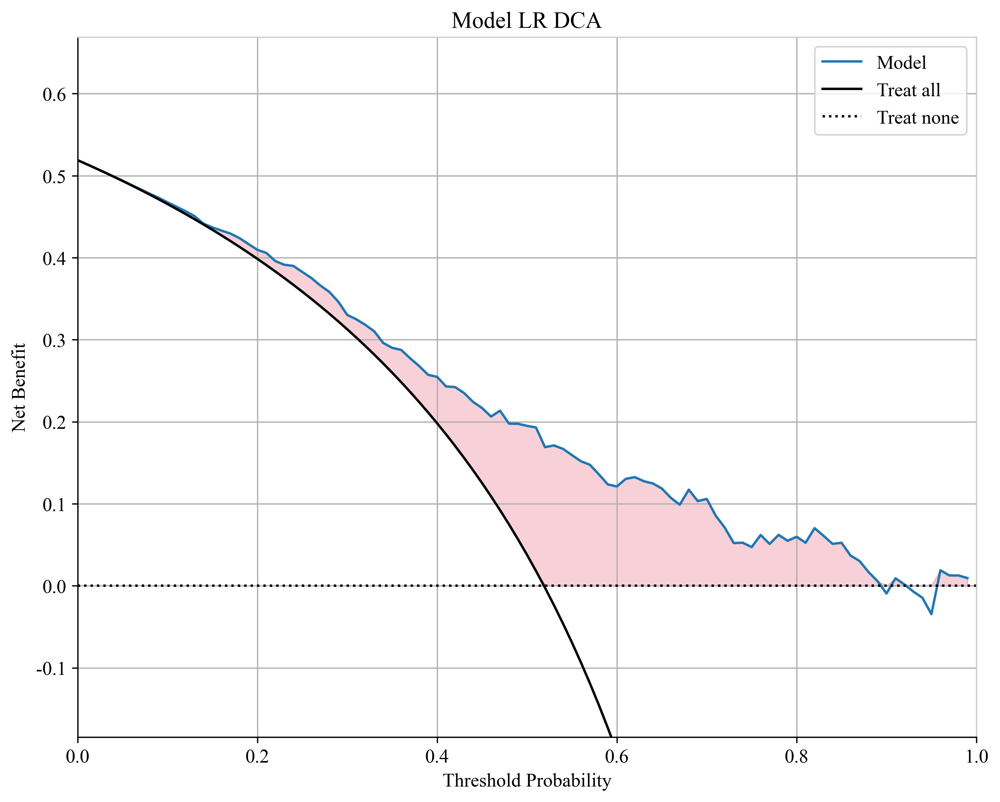

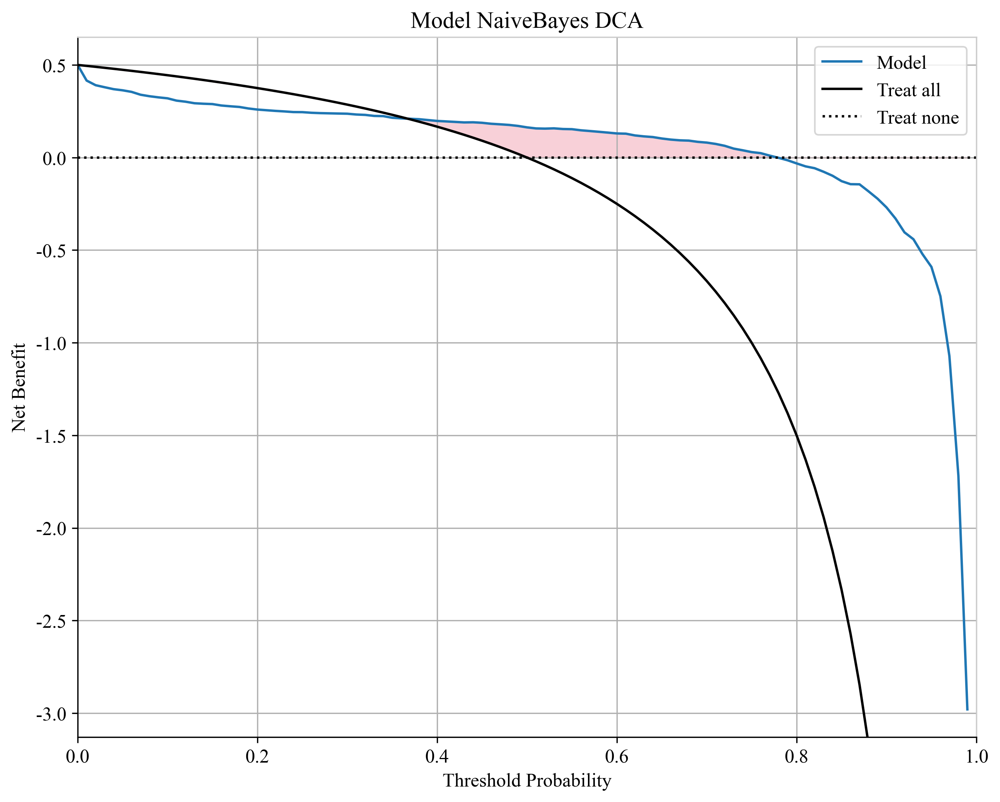

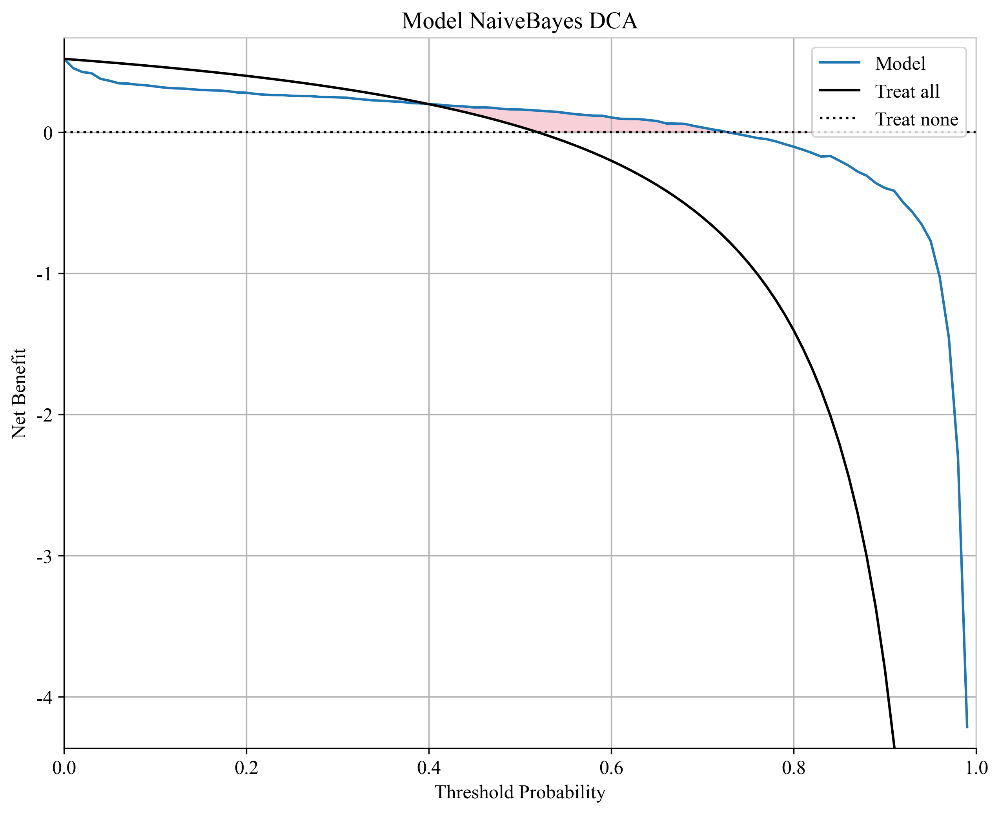

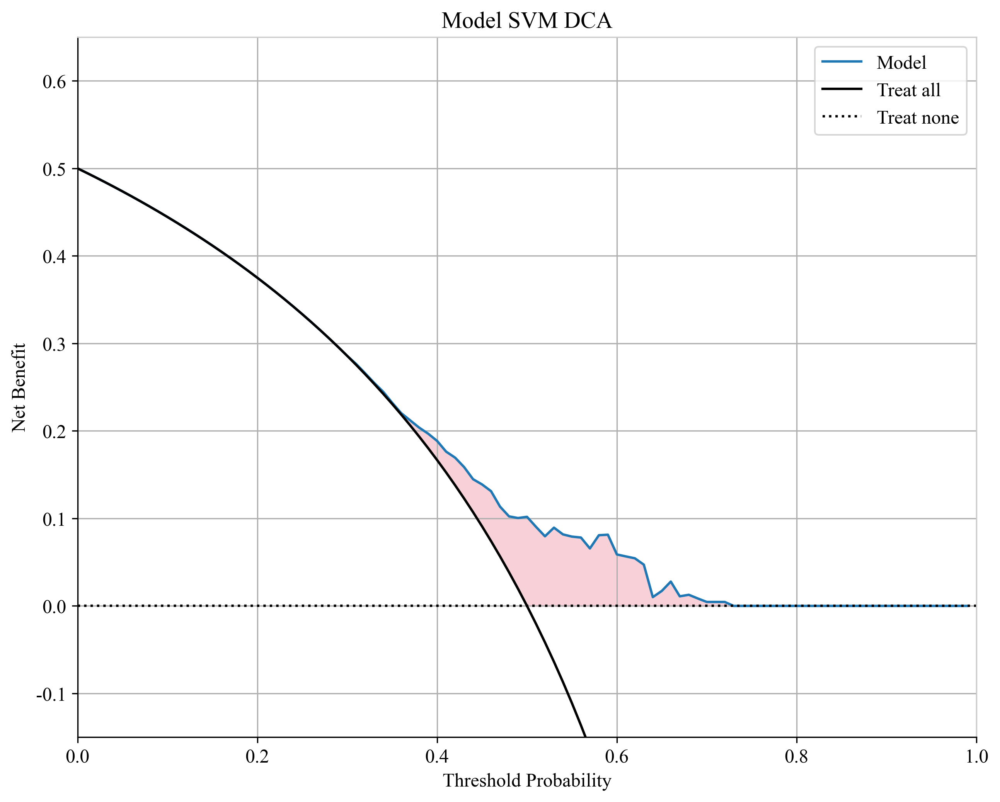

...

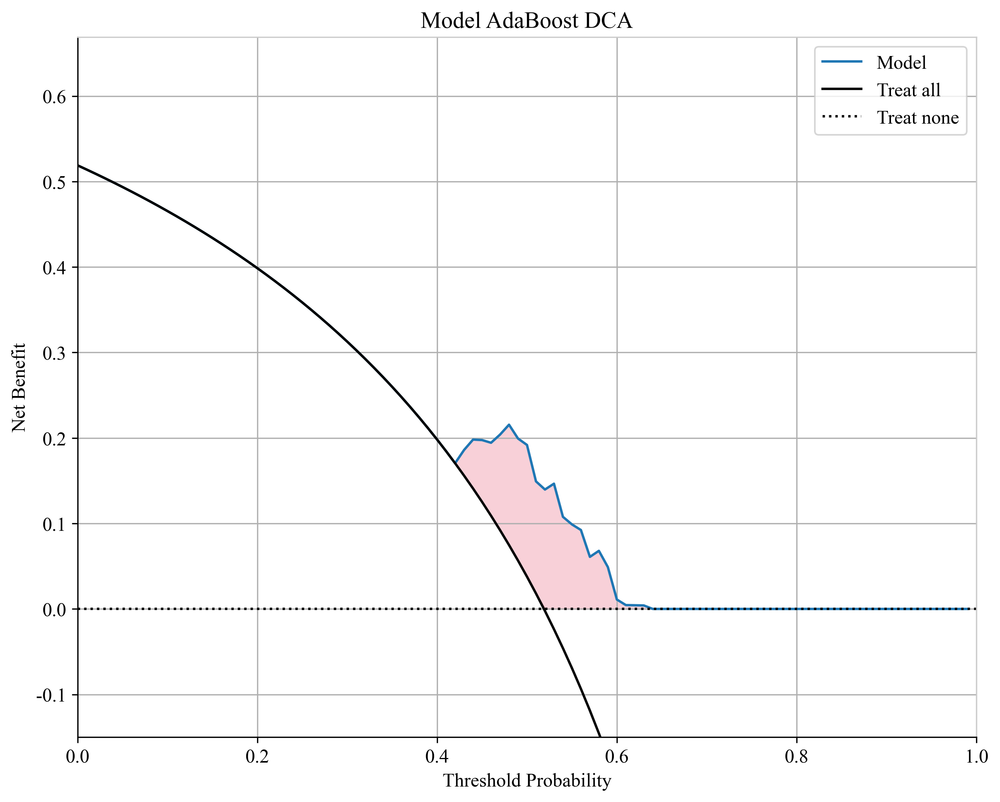

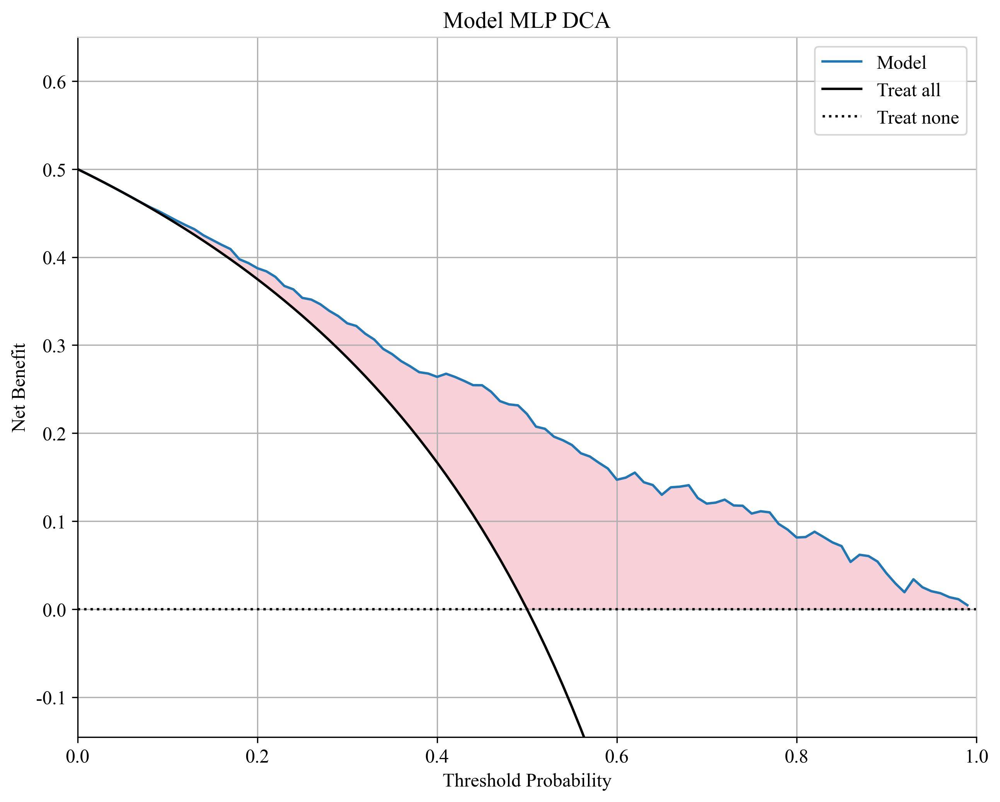

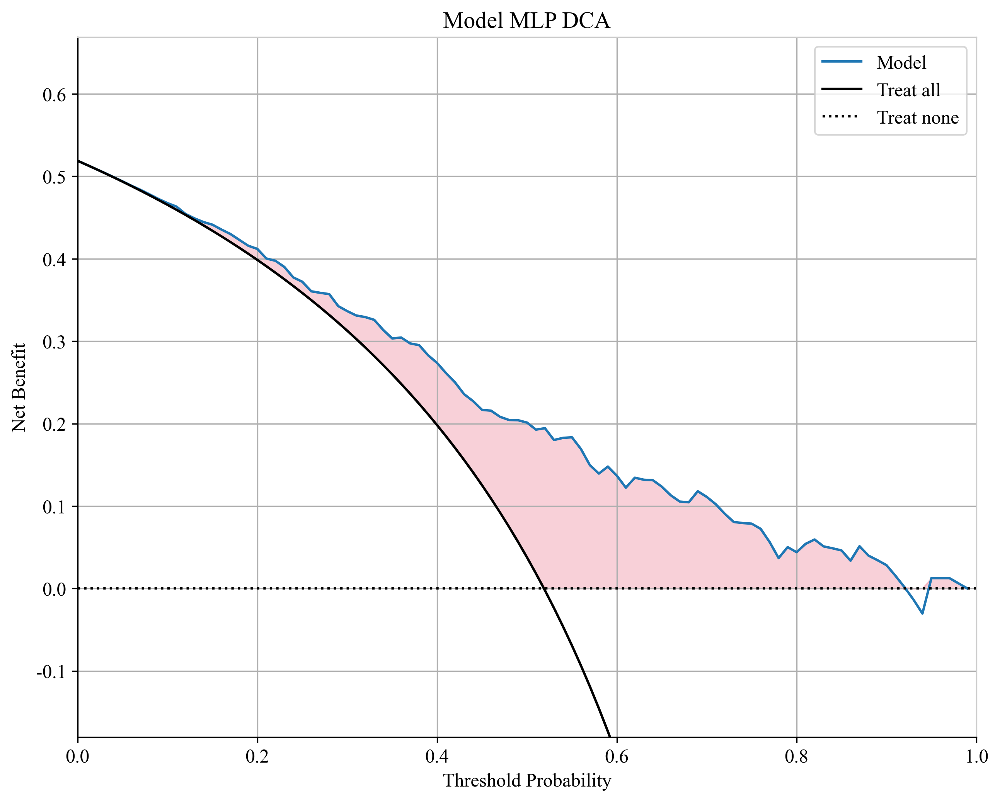

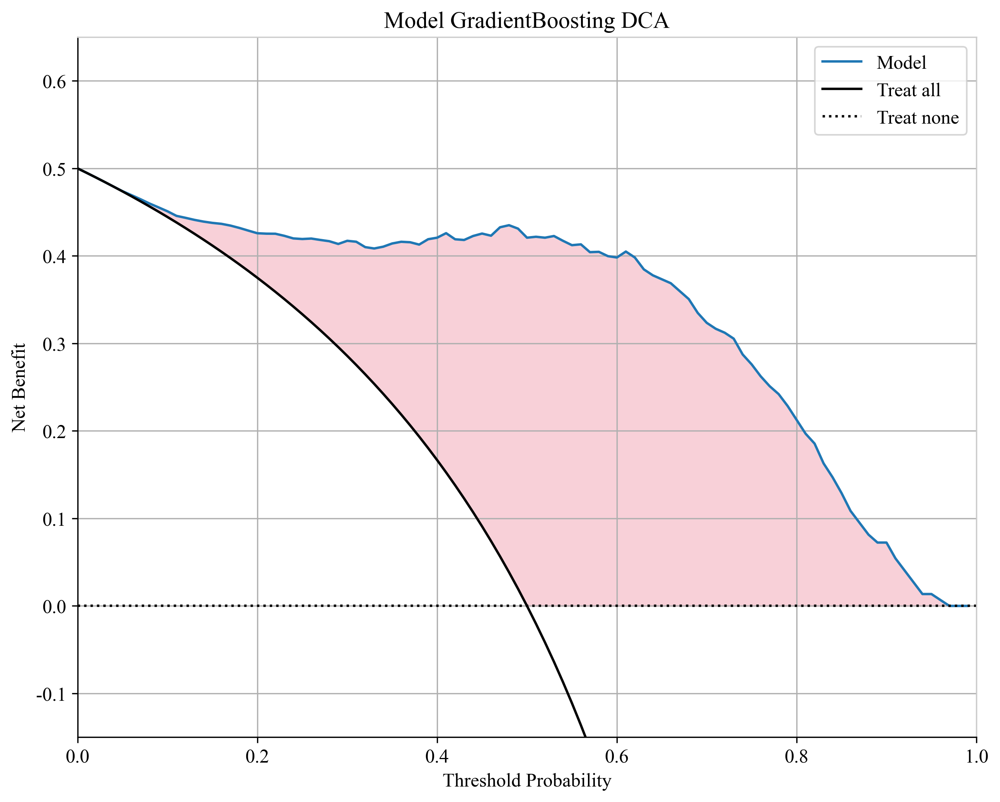

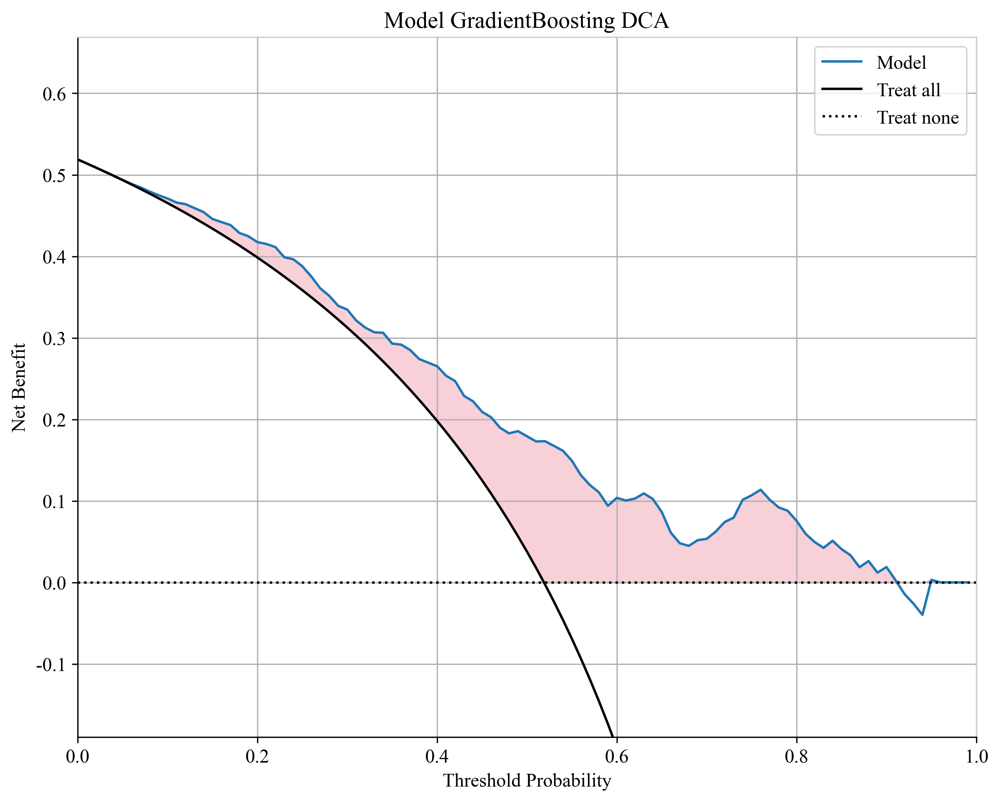

In [39]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}_model_{sm}_dca_train.svg', bbox_inches = 'tight')
            plt.show()
            # 绘制测试集
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}_model_{sm}_dca_test.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

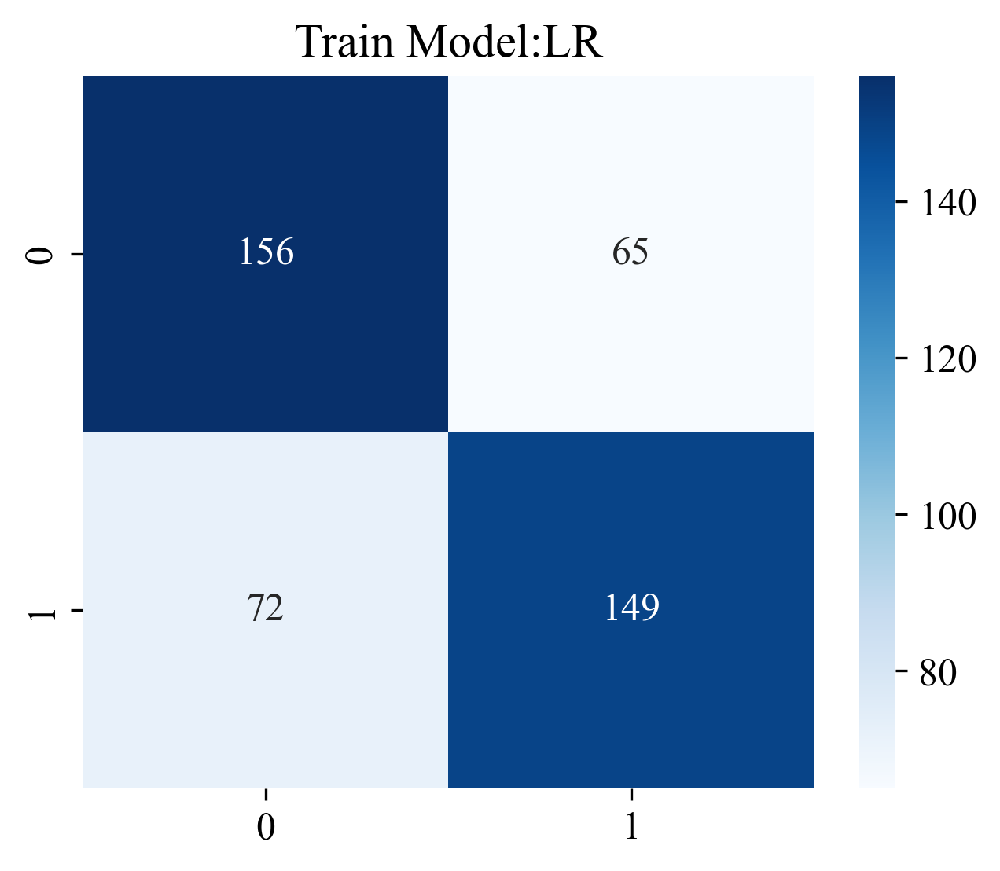

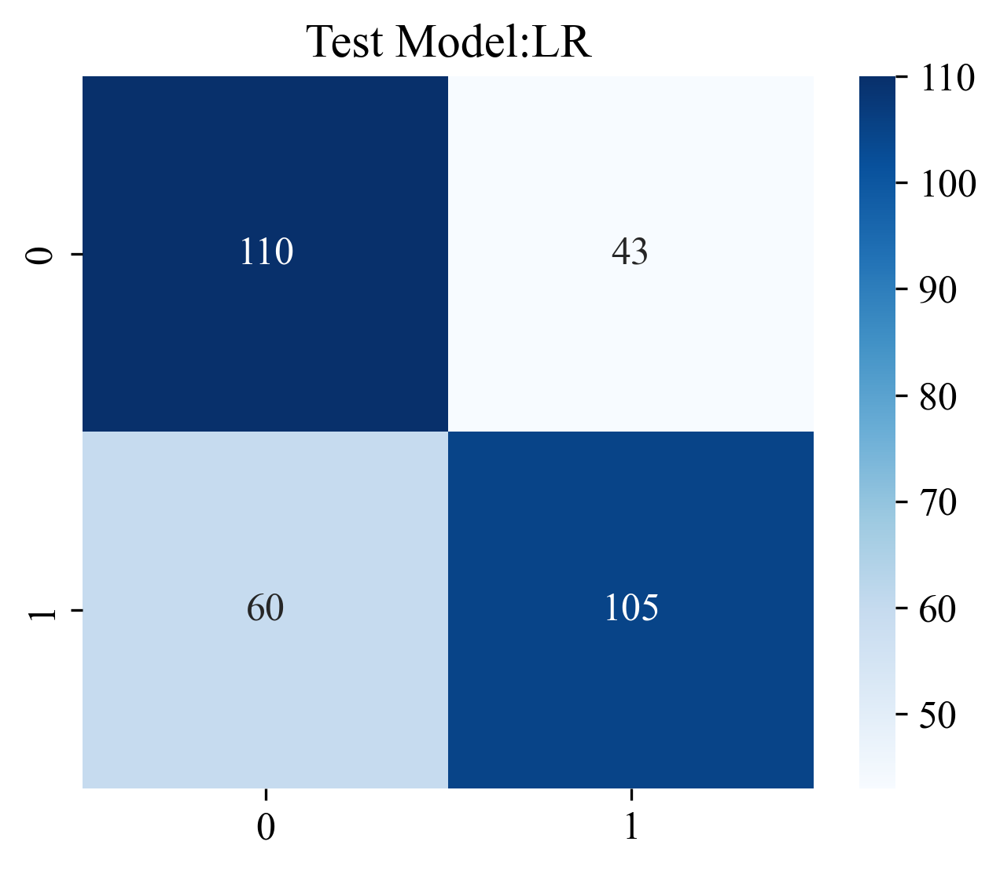

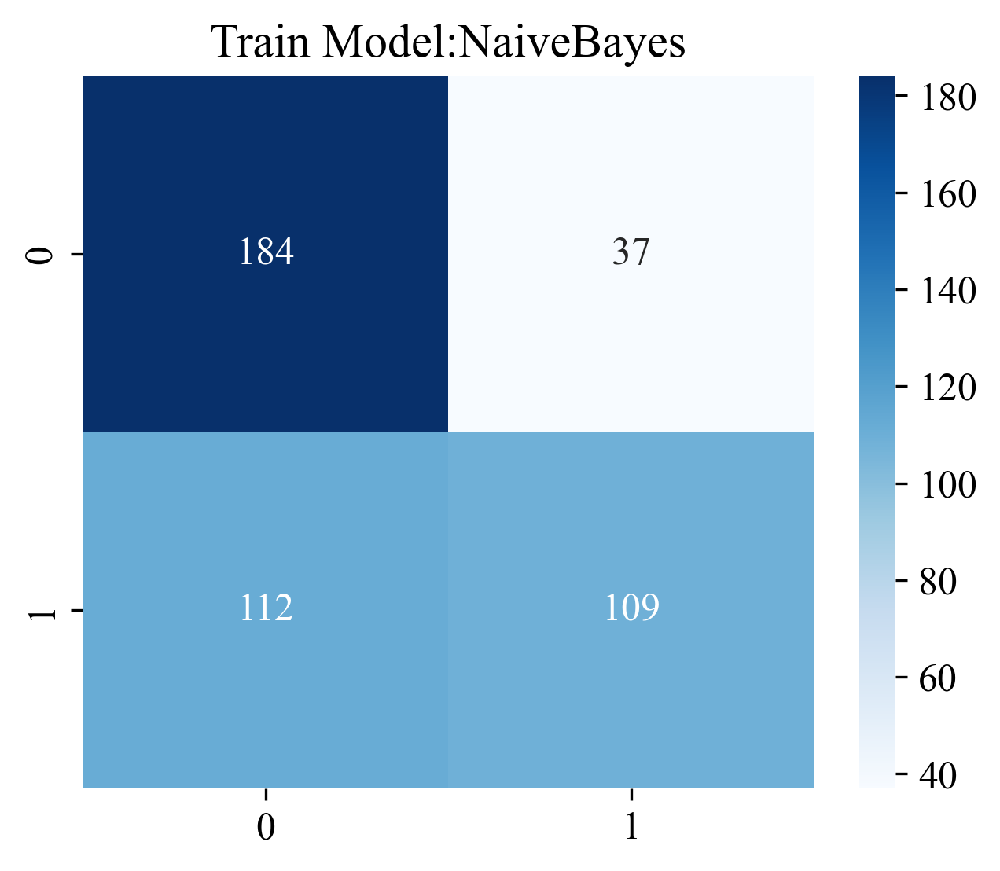

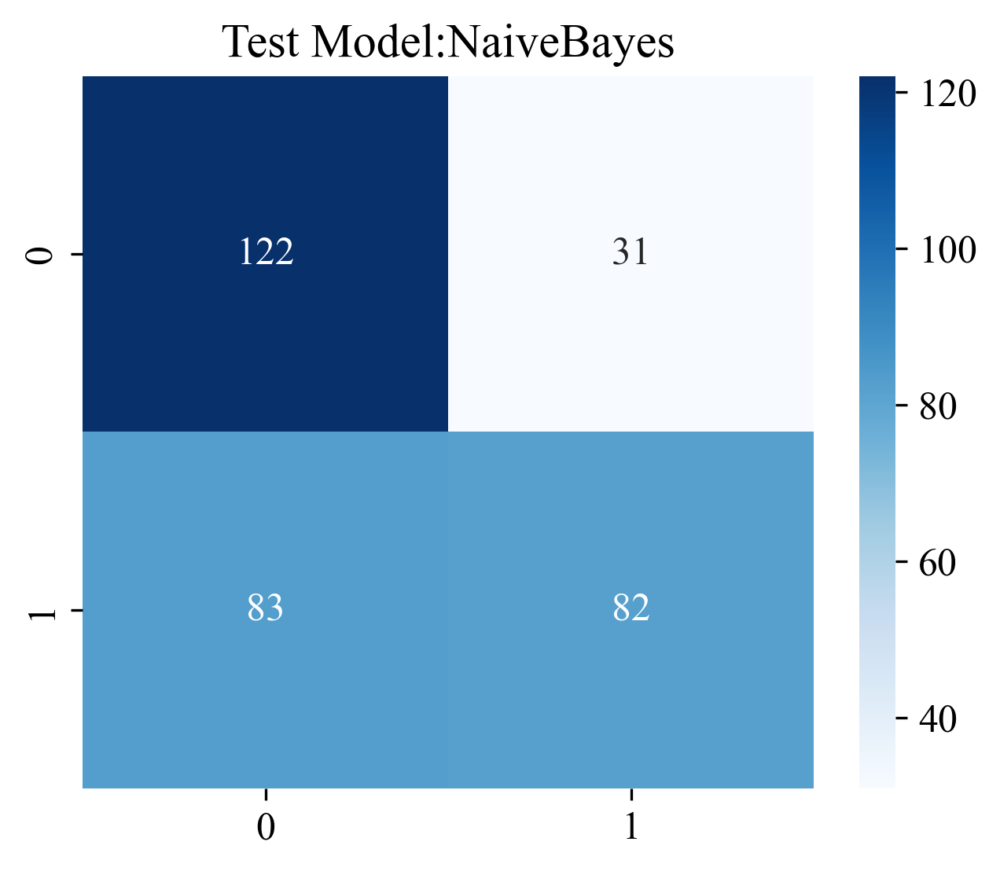

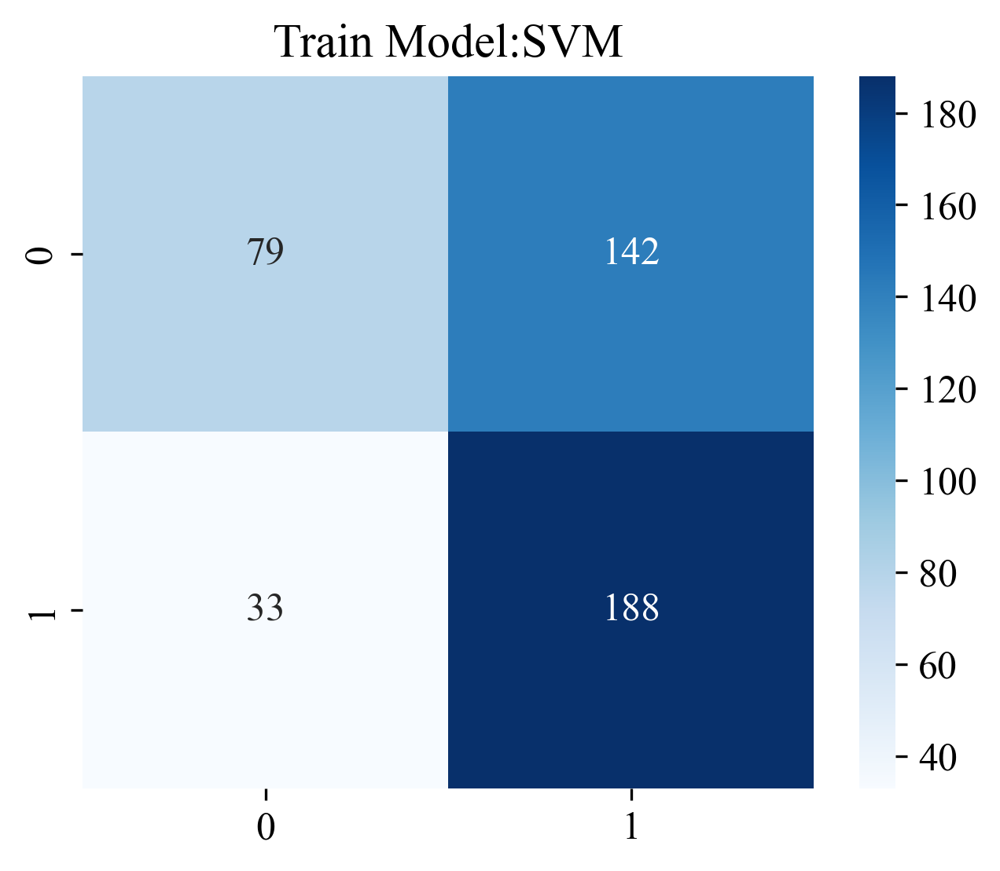

...

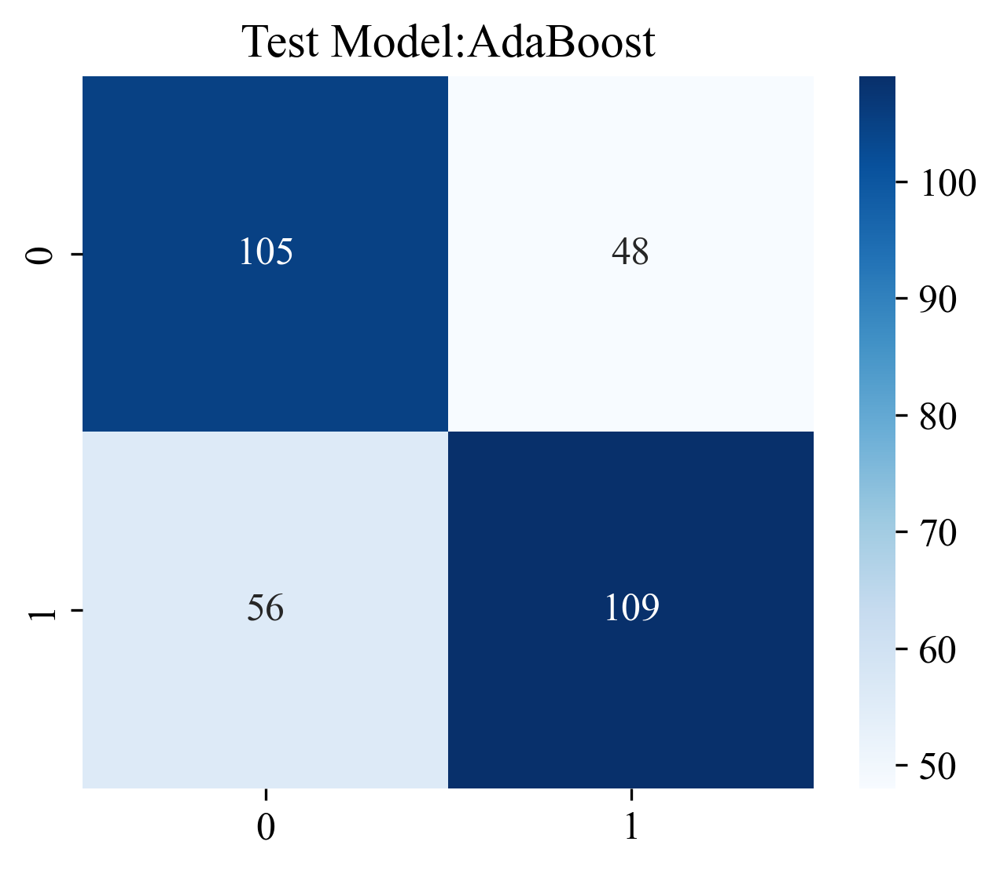

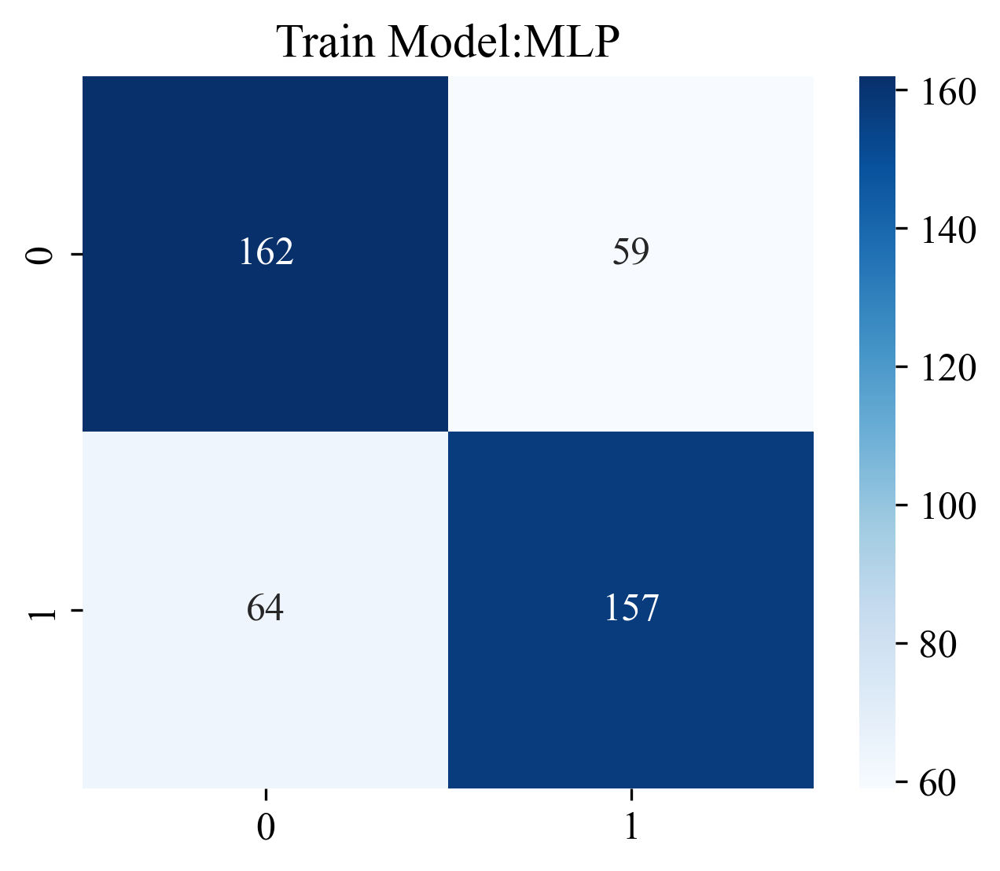

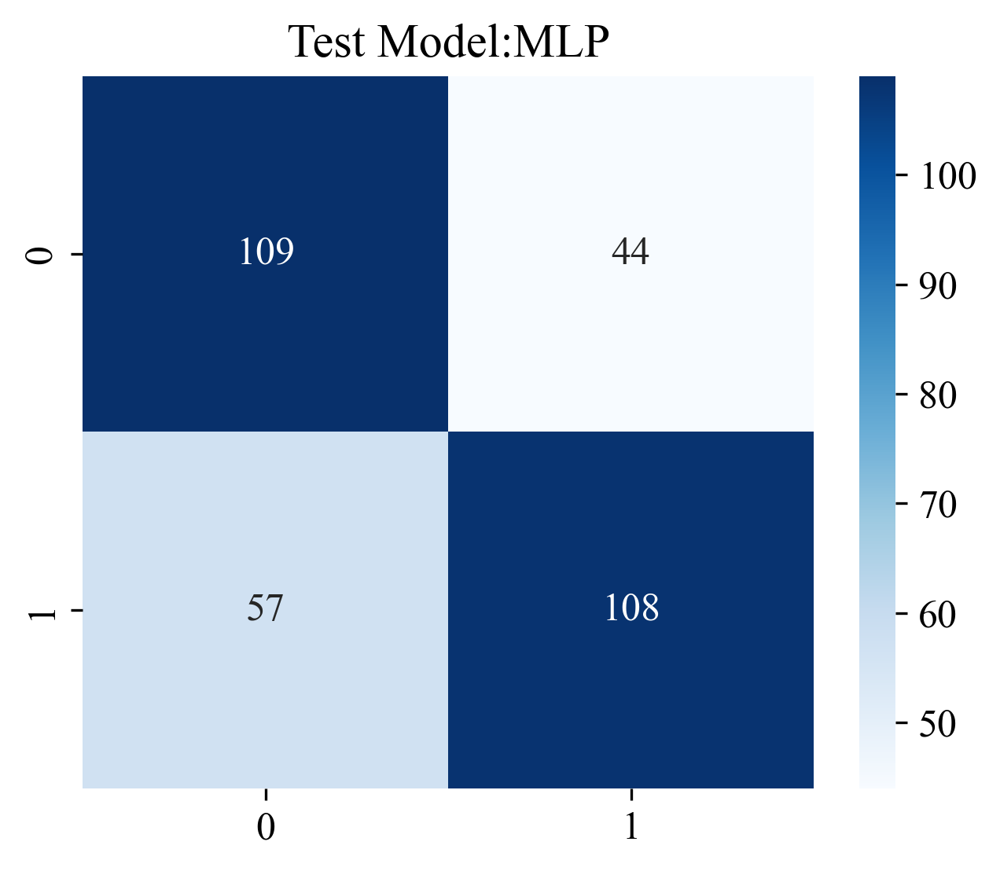

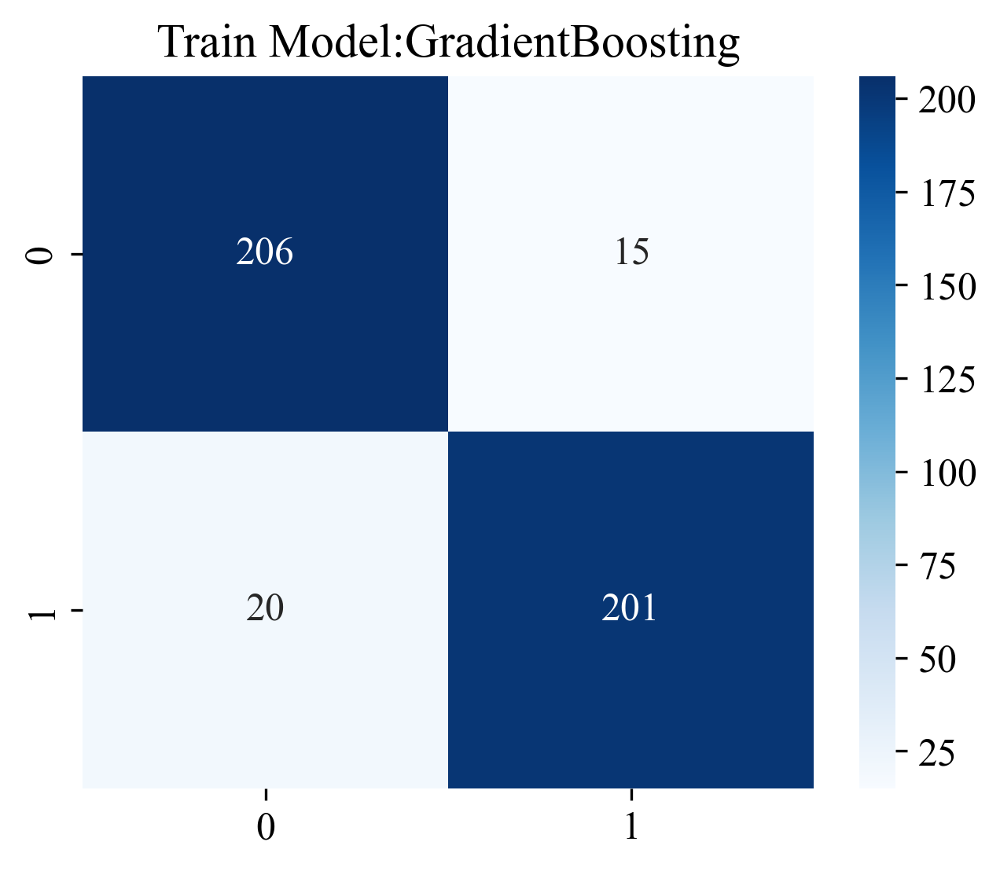

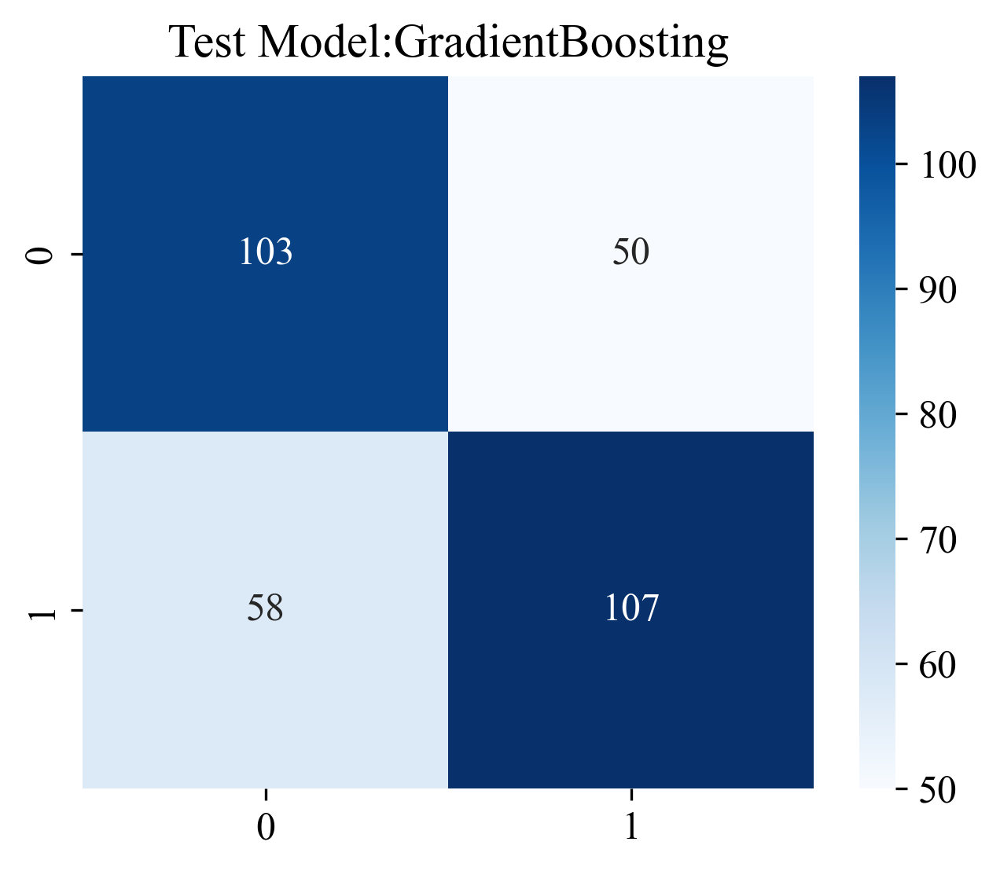

In [40]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Train Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}_model_{sm}_cm_train.svg', bbox_inches = 'tight')
            plt.show()
            # 绘制测试集
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Test Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}_model_{sm}_cm_test.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

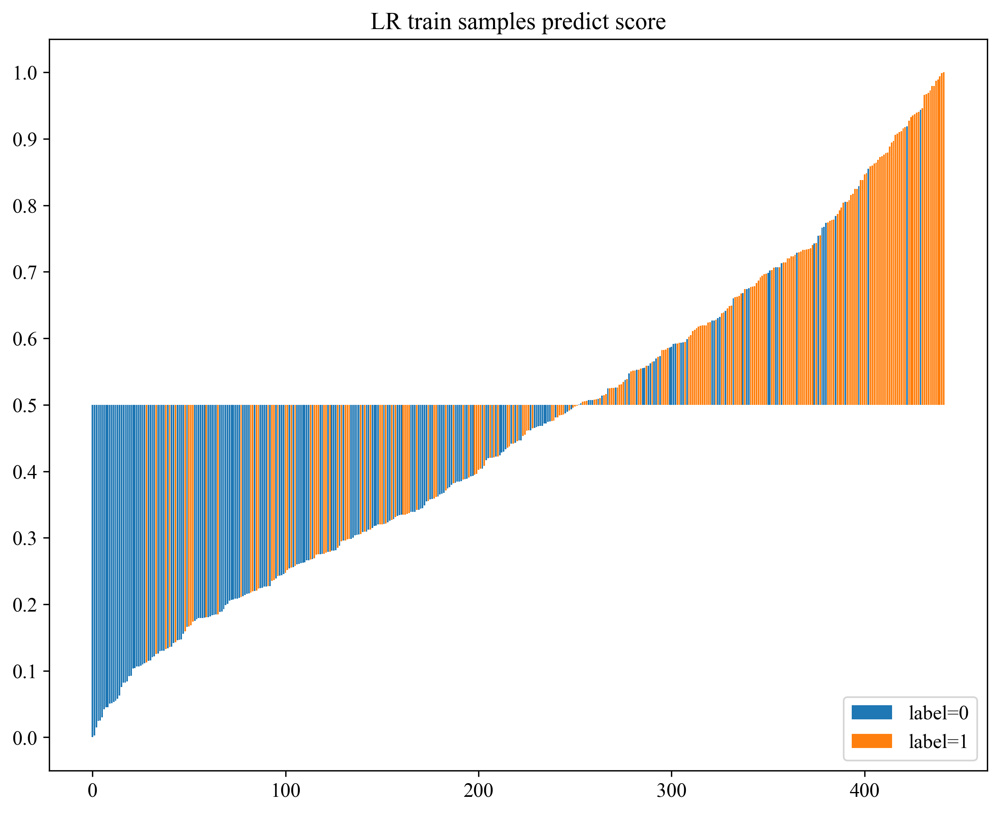

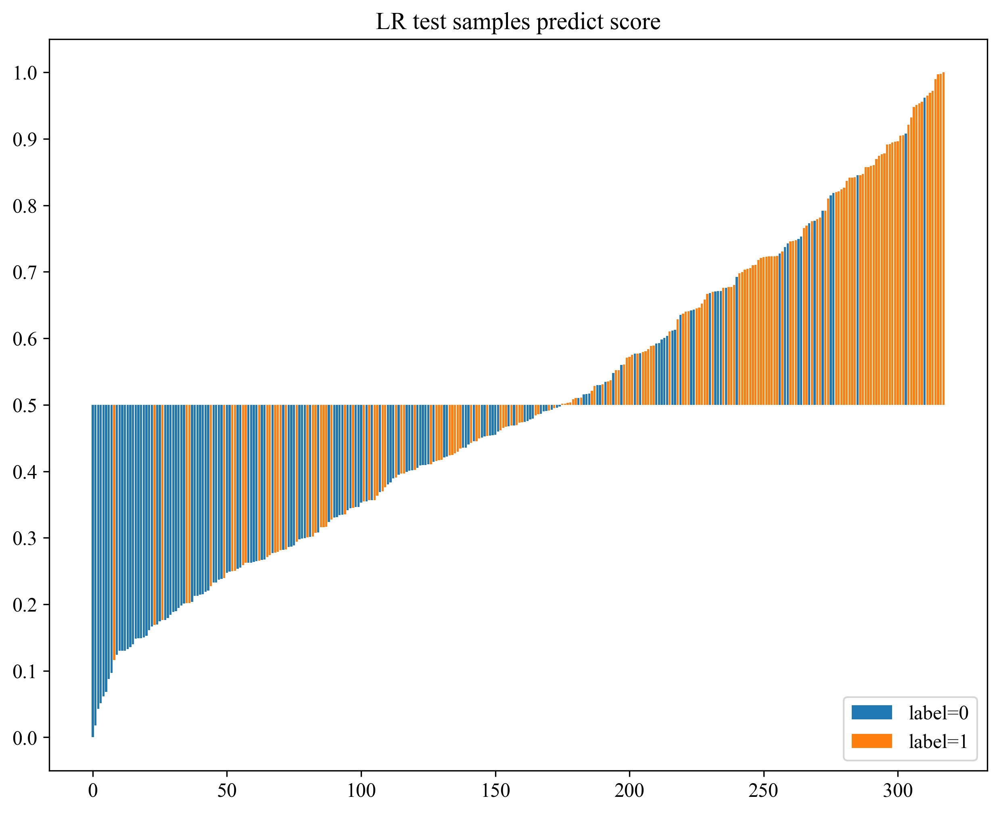

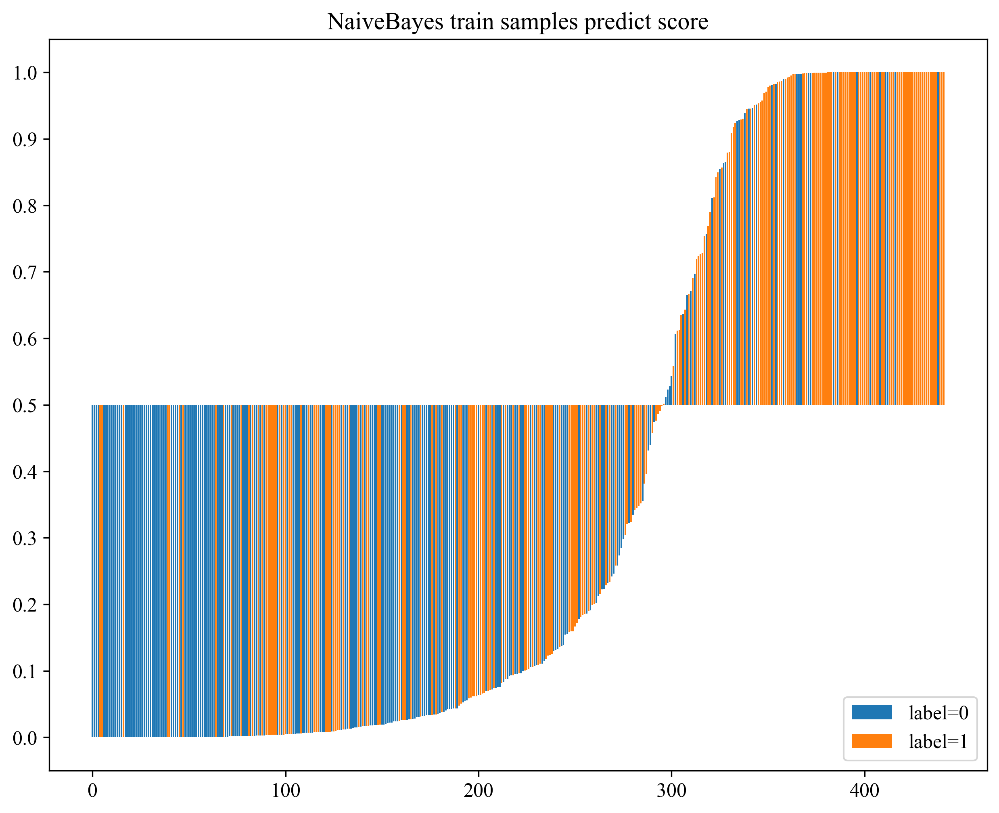

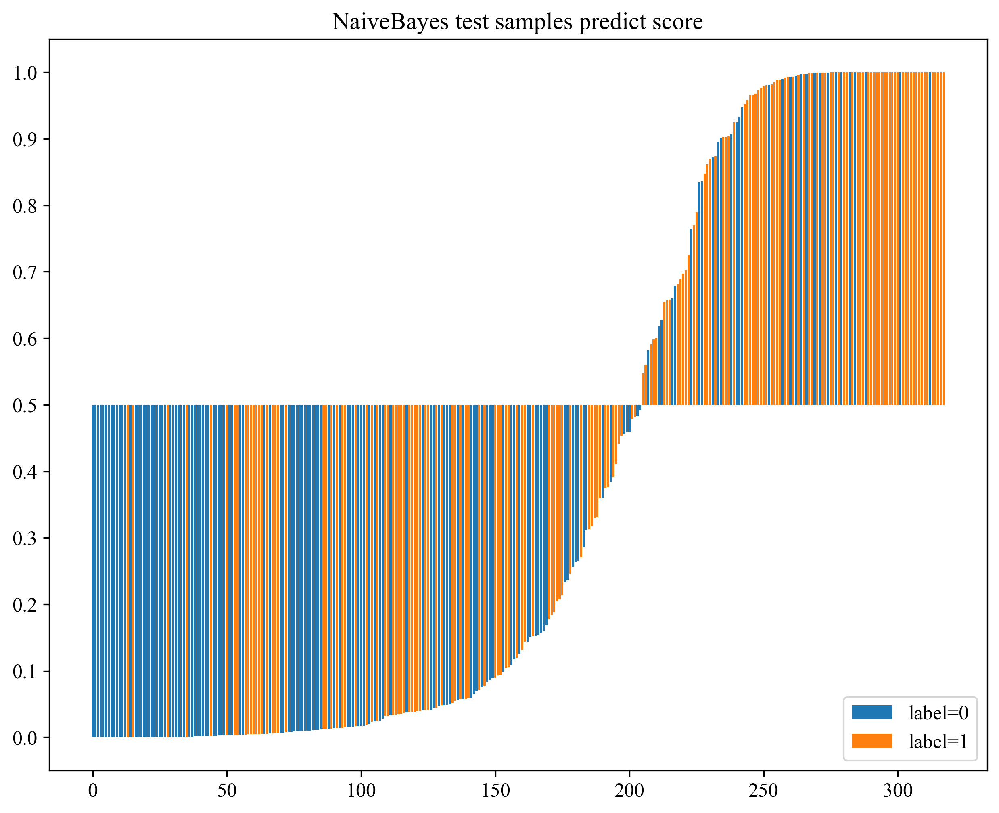

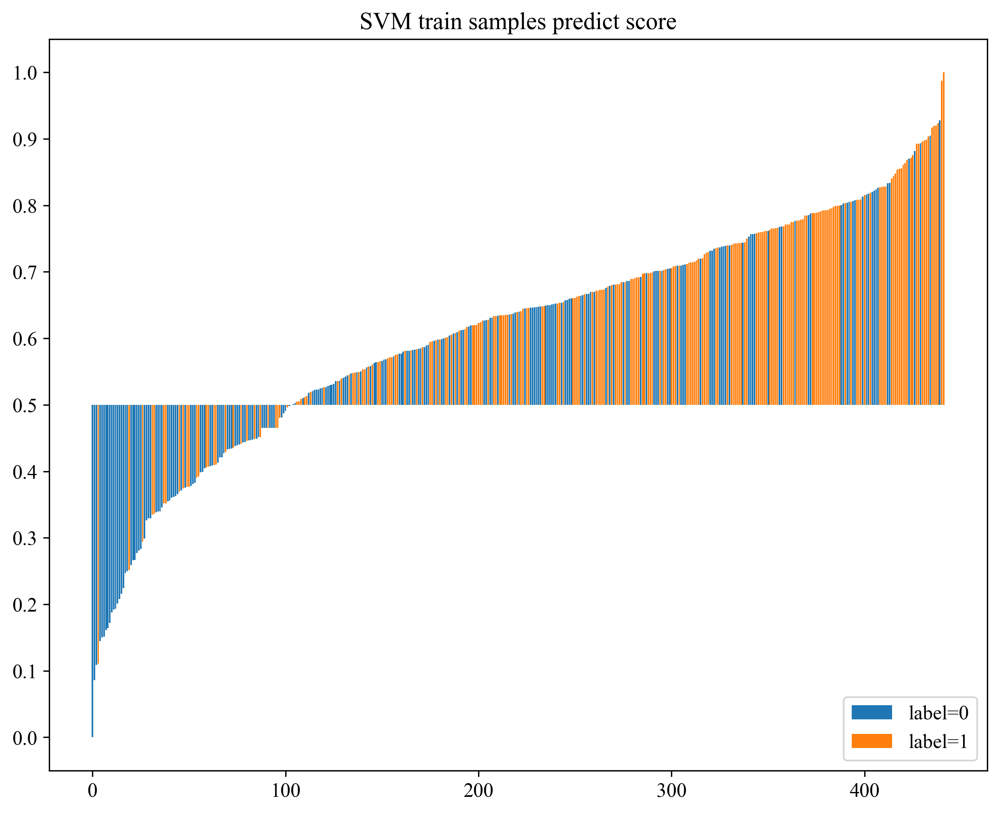

...

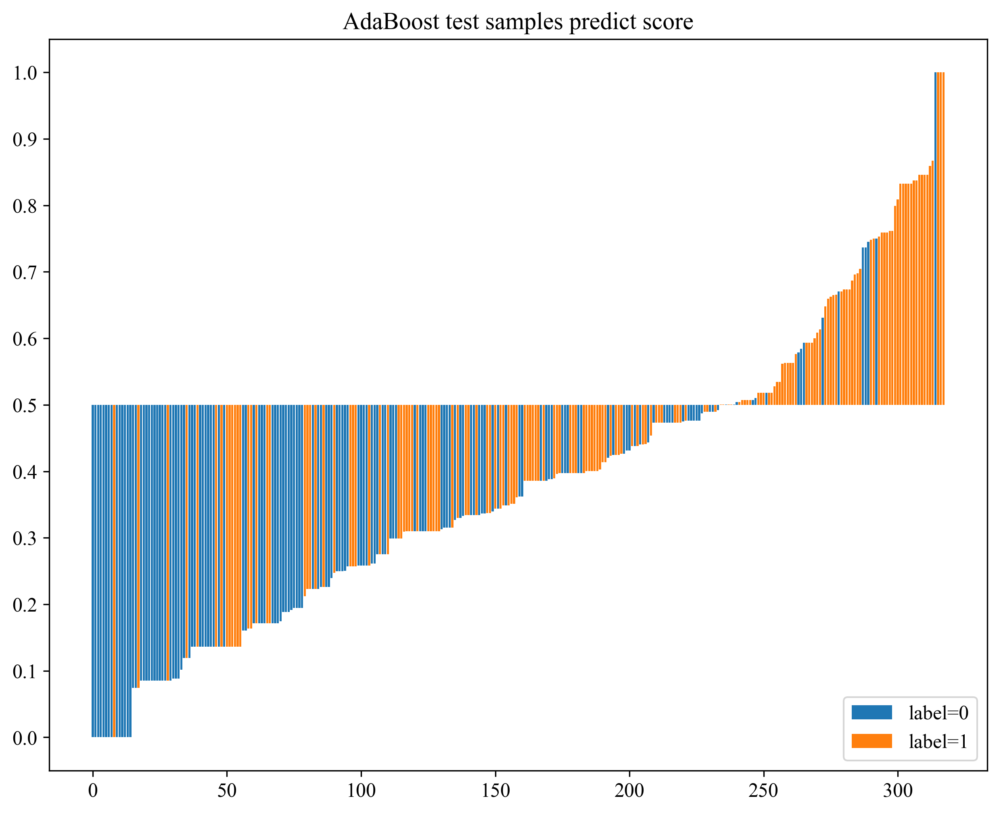

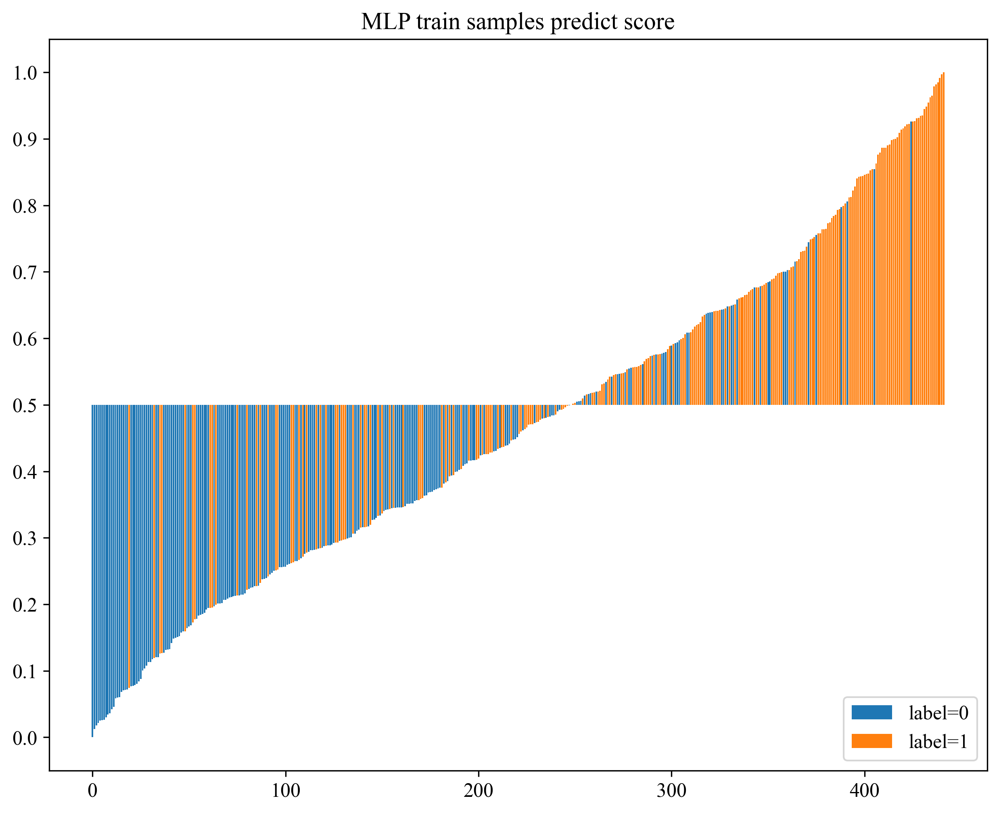

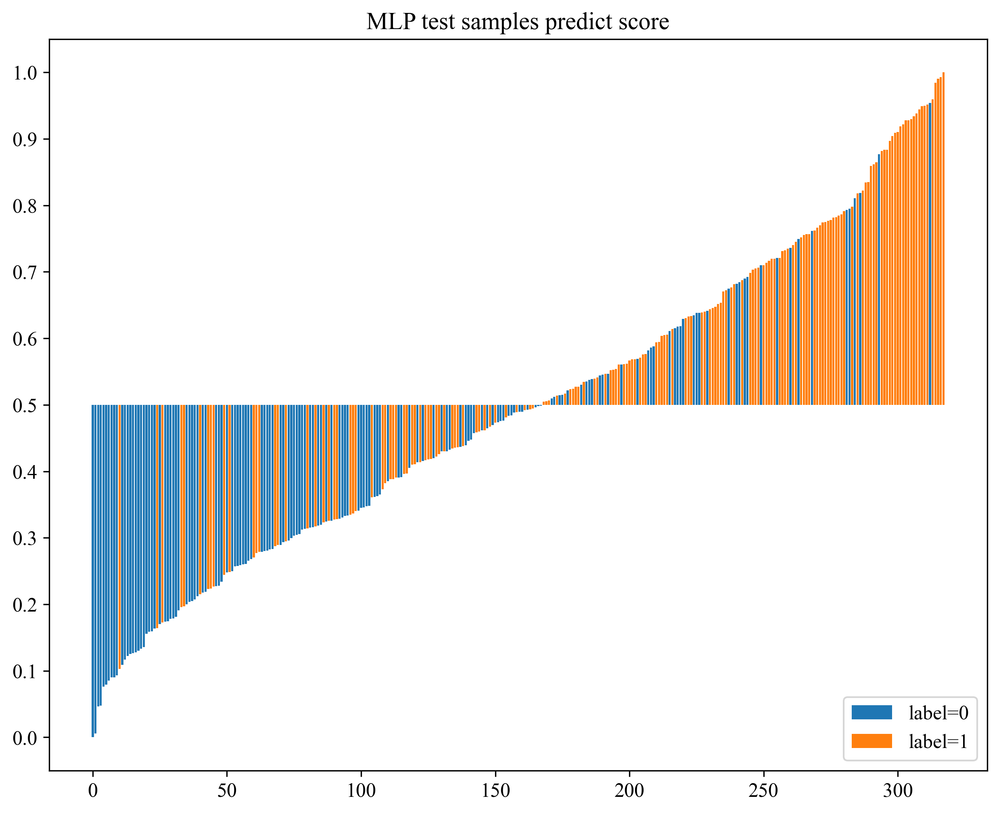

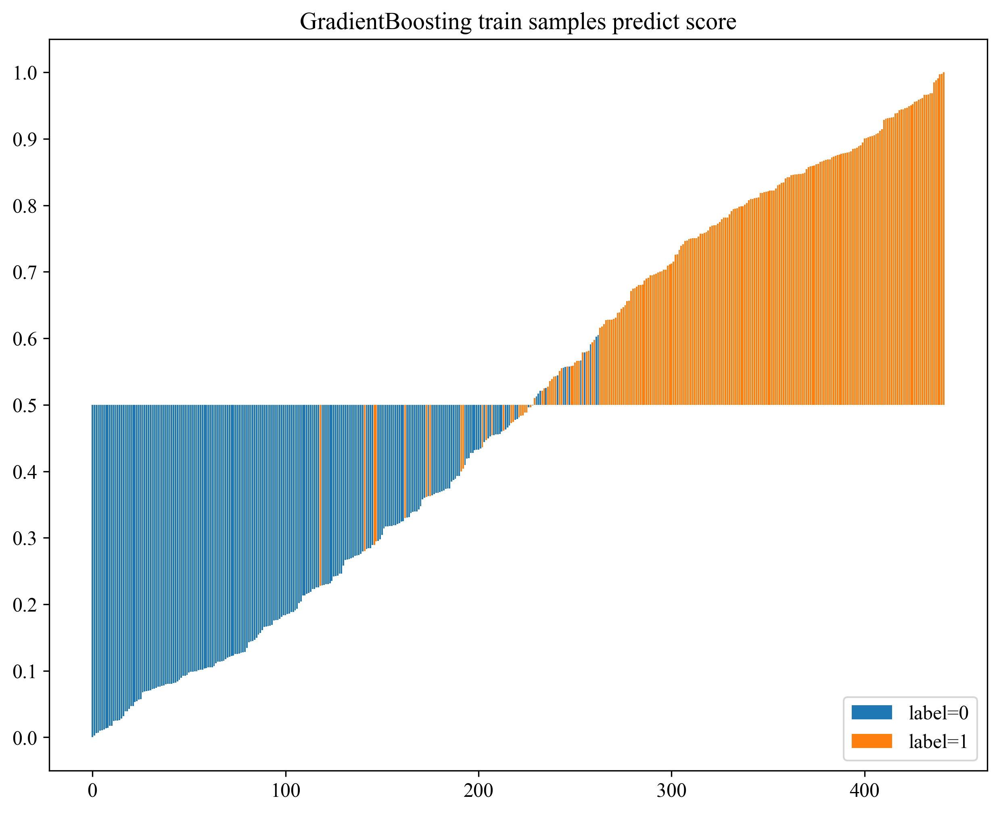

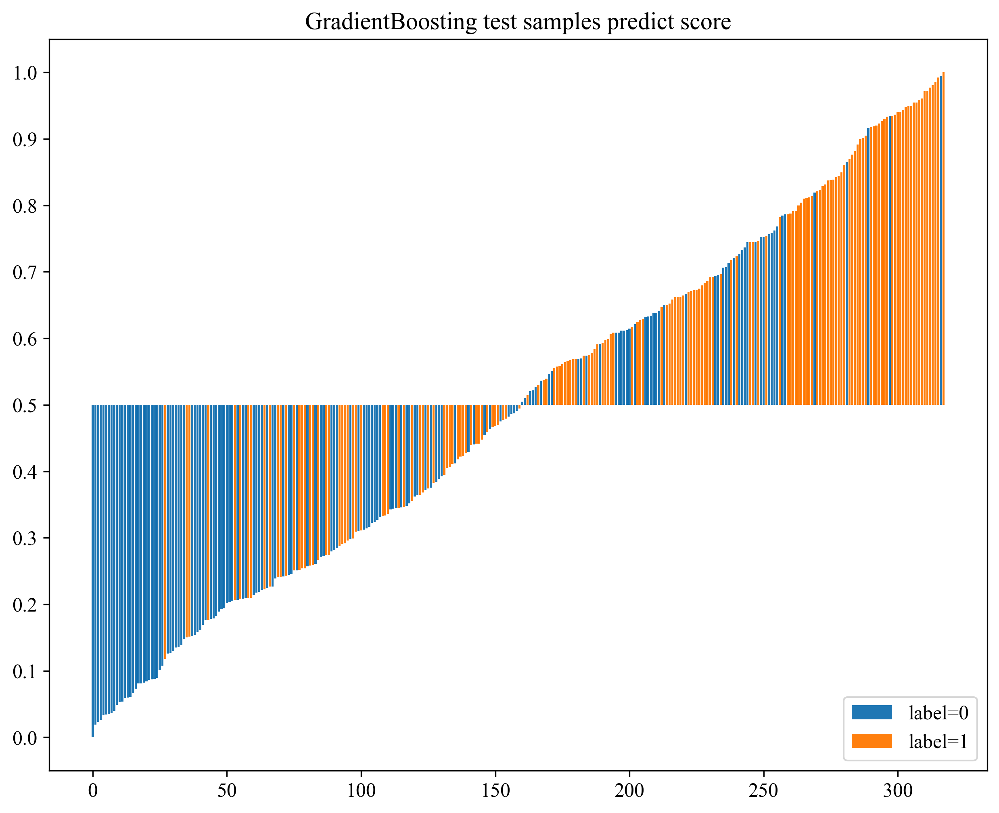

In [41]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} train samples predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}_model_{sm}_sample_dis_train.svg', bbox_inches = 'tight')
            plt.show()
            # 绘制测试集
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} test samples predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}_model_{sm}_sample_dis_test.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [42]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), 
                                        columns=columns)
            result_train.to_csv(f'results/{task_type}_{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), 
                                       columns=columns)
            result_test.to_csv(f'results/{task_type}_{sm}_test.csv', index=False)
            